In [2]:
import pandas as pd

In [4]:
pd.set_option('display.max_columns', 500)

In [6]:
df = pd.read_csv('../cleaned_data_v2.csv')

In [7]:
df

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1131,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,2-3 Bathrooms,11391.0,27.1,1.708484,False,12240
21609,400000.0,4,2.50,5813,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,2-3 Bathrooms,6034.0,29.8,1.990125,False,18480
21610,402101.0,2,0.75,1350,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,Studio or 1 Bathroom,9389.0,29.3,0.886906,False,7140
21611,400000.0,3,2.50,2388,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,2-3 Bathrooms,487.0,29.3,2.354171,False,12800


In [68]:
cont_cols = ['price','bathrooms','sqft_lot','floors','yr_built','yr_renovated','lat','long','nearest_station_distance_km','density','commute_time','distance_to_point_km','grade_living']
cat_cols = ['bedrooms','waterfront','view','condition','zipcode','bathroom_category','is_near_shore','floors','bathrooms']

In [9]:
def apply_transformations(df, column_names, methods):
    """
    Apply transformations to specified columns in the DataFrame.

    Parameters:
    - df: DataFrame
    - column_names: List of column names to transform
    - methods: List of transformation methods corresponding to each column
               Valid methods: 'log', 'sqrt', 'cube'

    Returns:
    - transformed_df: DataFrame with transformations applied to specified columns
    """

    transformed_df = df.copy()

    # Iterate over each column name and corresponding method
    for col, method in zip(column_names, methods):
        # Define the transformation function based on the specified method
        if method == 'log':
            transformation_func = np.log1p
        elif method == 'sqrt':
            transformation_func = np.sqrt
        elif method == 'cube':
            transformation_func = np.cbrt
        else:
            raise ValueError(f"Invalid transformation method: {method}")

        # Apply the transformation to the specified column
        transformed_column = transformation_func(transformed_df[col])

        # Update the column in the transformed DataFrame
        transformed_df[col] = transformed_column

    return transformed_df


In [11]:
import numpy as np

In [12]:
transformed_df = apply_transformations(df, ['price', 'sqft_lot','grade_living','nearest_station_distance_km','distance_to_point_km','density'], 
                                           ['log','log','log','sqrt','cube','sqrt'])
transformed_df

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,12.309987,3,1.00,8.639588,1.0,0,0,3,1955,0,98178,47.5112,-122.257,92.843967,Studio or 1 Bathroom,73.239334,32.9,0.841443,False,9.019301
1,13.195616,3,2.25,8.887791,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,45.587071,2-3 Bathrooms,89.437129,28.9,1.448408,False,9.797627
2,12.100718,2,1.00,9.210440,1.0,0,0,3,1933,0,98028,47.7379,-122.233,90.053052,Studio or 1 Bathroom,61.911227,33.1,1.323378,False,8.438366
3,13.311331,4,3.00,8.517393,1.0,0,0,5,1965,0,98136,47.5208,-122.393,94.436850,2-3 Bathrooms,86.700634,30.6,0.466725,True,9.526683
4,13.142168,3,2.00,8.997271,1.0,0,0,3,1987,0,98074,47.6168,-122.045,140.676225,1-2 Bathrooms,53.814496,32.7,1.205222,False,9.506065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,12.793862,3,2.50,7.031741,3.0,0,0,3,2009,0,98103,47.6993,-122.346,37.047496,2-3 Bathrooms,106.728628,27.1,1.195465,False,9.412546
21609,12.899222,4,2.50,8.668024,2.0,0,0,3,2014,0,98146,47.5107,-122.362,92.223540,2-3 Bathrooms,77.678826,29.8,1.257844,False,9.824498
21610,12.904461,2,0.75,7.208600,2.0,0,0,3,2009,0,98144,47.5944,-122.299,44.070177,Studio or 1 Bathroom,96.896852,29.3,0.960784,False,8.873608
21611,12.899222,3,2.50,7.778630,2.0,0,0,3,2004,0,98027,47.5345,-122.069,137.635191,2-3 Bathrooms,22.068076,29.3,1.330289,False,9.457279


In [13]:
encode_cols2 = ['bedrooms','floors','view','condition','zipcode','bathroom_category']

In [ ]:
encoded_df = pd.get_dummies(transformed_df, columns=encode_cols2)
encoded_df

In [15]:
from sklearn.decomposition import SparsePCA
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, explained_variance_score
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt

In [32]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

def kmeans_clustering_analysis(X, param_grid_kmeans={'n_clusters': [2, 3, 4, 5, 6, 7, 8, 9, 10]}):
    """
    Perform K-means clustering analysis on the input data.

    Parameters:
    X (DataFrame): Input data to be clustered.
    param_grid_kmeans (dict): Parameter grid for number of clusters in K-means.

    Returns:
    best_n_clusters (int): The best number of clusters based on silhouette score.
    silhouette_avg (float): The average silhouette score for the best number of clusters.
    """
    # Store the silhouette scores for each number of clusters
    silhouette_scores = []

    # Elbow Method: Store the within-cluster sum of squares (WCSS) for each number of clusters
    wcss = []

    for n_clusters in param_grid_kmeans['n_clusters']:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(X)
        
        # Calculate silhouette score
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_scores.append(silhouette_avg)
        
        # Calculate WCSS
        wcss.append(kmeans.inertia_)

    # Find the number of clusters with the highest silhouette score
    best_n_clusters = param_grid_kmeans['n_clusters'][silhouette_scores.index(max(silhouette_scores))]
    best_silhouette_avg = max(silhouette_scores)

    # Plot the Elbow curve
    plt.figure(figsize=(5, 3))
    plt.plot(param_grid_kmeans['n_clusters'], wcss, marker='o')
    plt.title('Elbow Method')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Within-cluster Sum of Squares (WCSS)')

    # Annotate the plot with the best cluster
    plt.annotate(f'Best Cluster: {best_n_clusters}', 
                 xy=(best_n_clusters, wcss[param_grid_kmeans['n_clusters'].index(best_n_clusters)]),
                 xytext=(best_n_clusters + 0.5, wcss[param_grid_kmeans['n_clusters'].index(best_n_clusters)] + 100),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.show()

    print("Best Number of Clusters:", best_n_clusters)
    print("Silhouette Score:", best_silhouette_avg)

    return best_n_clusters, best_silhouette_avg

# Example usage
# X_subset_grade = encoded_df[['grade_living']]
# best_n_clusters, silhouette_avg = kmeans_clustering_analysis(X_subset_grade)


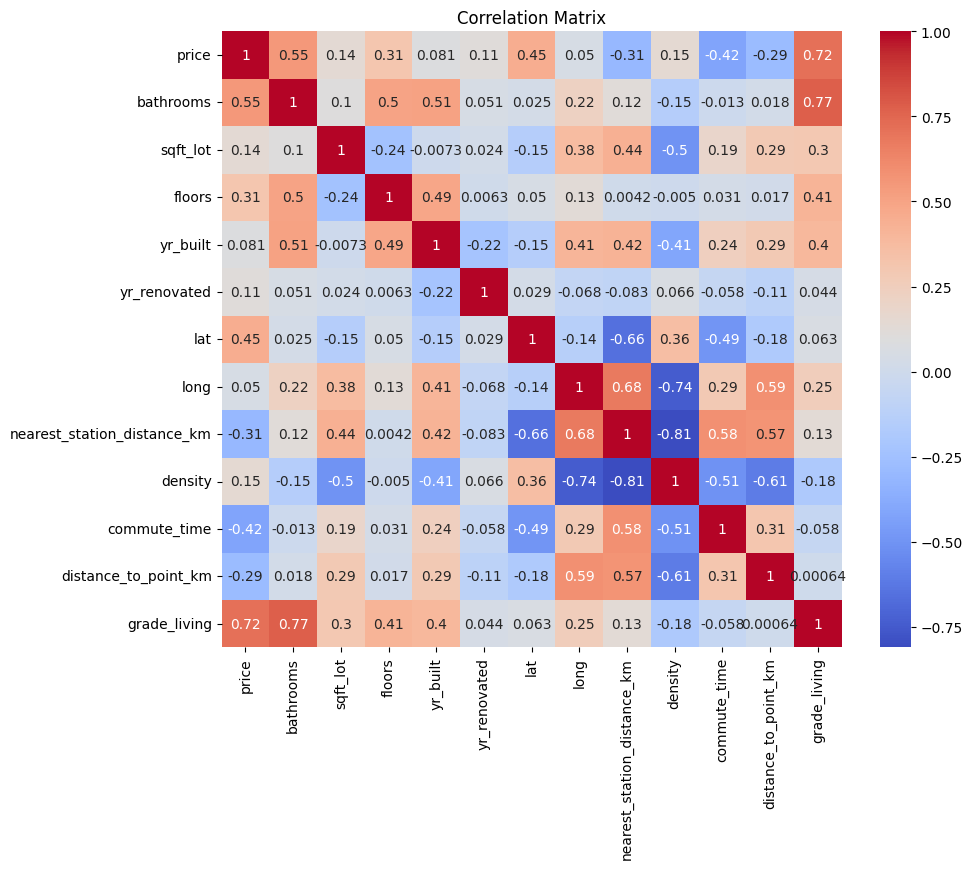

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only the continuous columns
cont_df = transformed_df[cont_cols]

# Calculate the correlation matrix
corr_matrix = cont_df.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


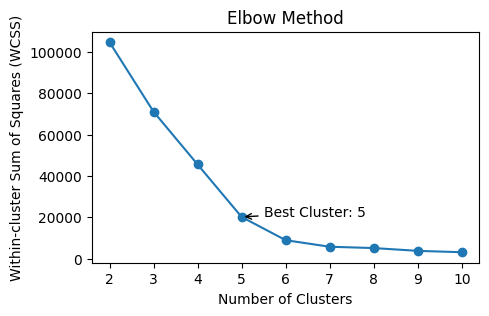

Best Number of Clusters: 5
Silhouette Score: 0.8257231951916311


(5, 0.8257231951916311)

In [33]:
X_subset = transformed_df[['grade_living','view']]
encoded_df = pd.get_dummies(X_subset, columns=['view'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

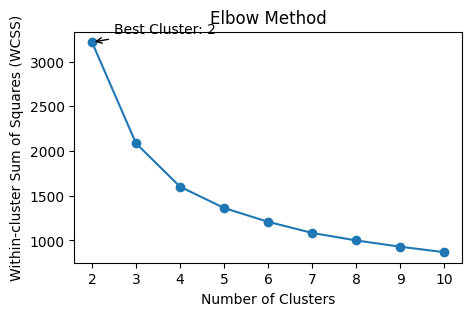

Best Number of Clusters: 2
Silhouette Score: 0.4524359464873075


(2, 0.4524359464873075)

In [35]:
X_subset = transformed_df[['grade_living','lat','long']]
#encoded_df = pd.get_dummies(X_subset, columns=['condition'])
#scale
#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset)

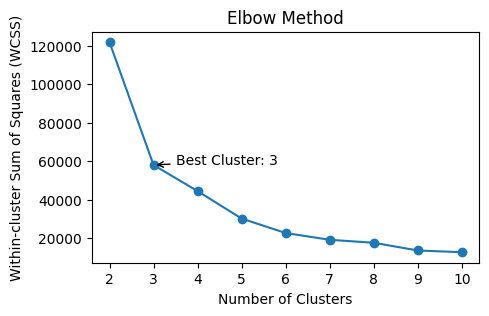

Best Number of Clusters: 3
Silhouette Score: 0.5160951533809737


(3, 0.5160951533809737)

In [40]:
X_subset = transformed_df[['grade_living','commute_time','view']]
encoded_df = pd.get_dummies(X_subset, columns=['view'])
#scale
#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#X_subset_scaled = scaler.fit_transform(X_subset)
kmeans_clustering_analysis(encoded_df)

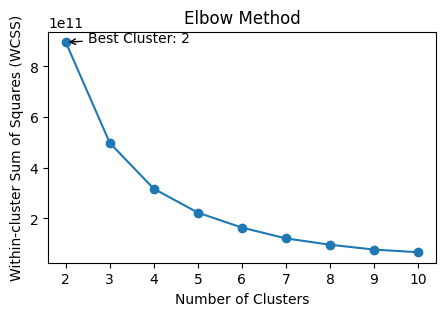

Best Number of Clusters: 2
Silhouette Score: 0.6539563692856345


(2, 0.6539563692856345)

In [41]:
X_subset = df[['grade_living','commute_time','view']]
encoded_df = pd.get_dummies(X_subset, columns=['view'])
#scale
#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()
#X_subset_scaled = scaler.fit_transform(X_subset)
kmeans_clustering_analysis(encoded_df)

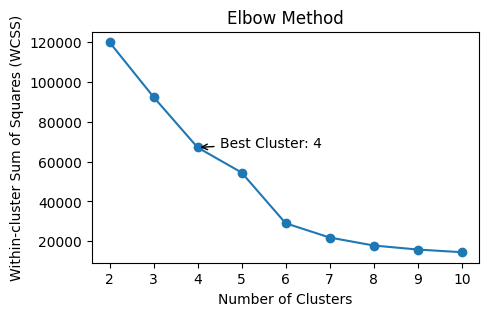

Best Number of Clusters: 4
Silhouette Score: 0.7170584258682907


(4, 0.7170584258682907)

In [42]:
X_subset = df[['grade_living','commute_time','view']]
encoded_df = pd.get_dummies(X_subset, columns=['view'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

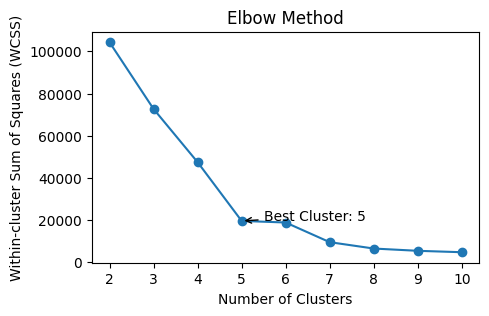

Best Number of Clusters: 5
Silhouette Score: 0.8494310142734697


(5, 0.8494310142734697)

In [43]:
X_subset = df[['grade_living','view']]
encoded_df = pd.get_dummies(X_subset, columns=['view'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

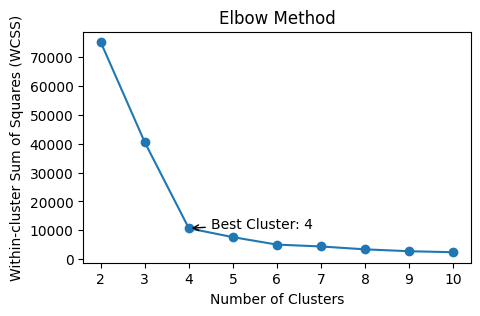

Best Number of Clusters: 4
Silhouette Score: 0.8089724875237407


(4, 0.8089724875237407)

In [44]:
X_subset = df[['grade_living','bathroom_category']]
encoded_df = pd.get_dummies(X_subset, columns=['bathroom_category'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

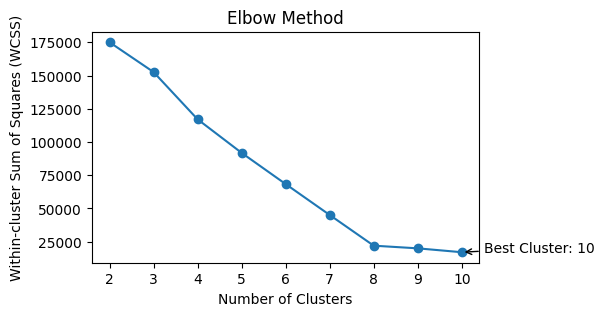

Best Number of Clusters: 10
Silhouette Score: 0.79917398935914


(10, 0.79917398935914)

In [45]:
X_subset = df[['grade_living','bathroom_category','view']]
encoded_df = pd.get_dummies(X_subset, columns=['bathroom_category','view'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

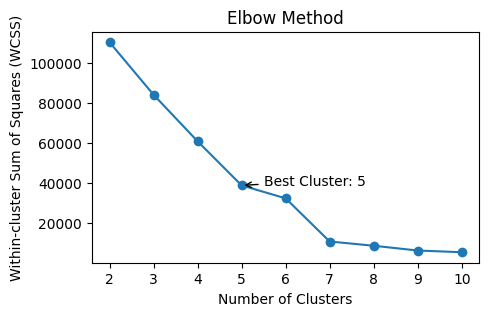

Best Number of Clusters: 5
Silhouette Score: 0.742764566224956


(5, 0.742764566224956)

In [46]:
X_subset = df[['grade_living','floors']]
encoded_df = pd.get_dummies(X_subset, columns=['floors'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

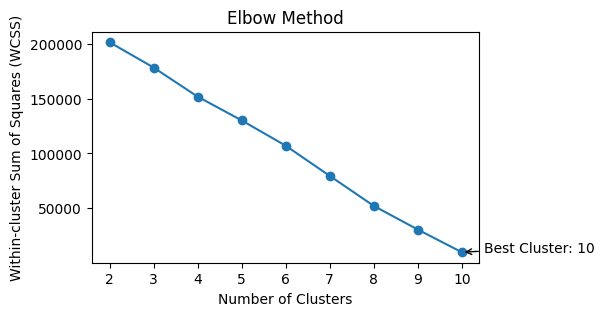

Best Number of Clusters: 10
Silhouette Score: 0.9689102989696008


(10, 0.9689102989696008)

In [50]:
X_subset = df[['view','floors']]
encoded_df = pd.get_dummies(X_subset, columns=['view','floors'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

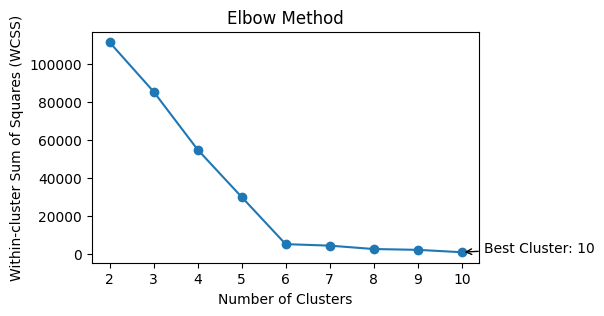

Best Number of Clusters: 10
Silhouette Score: 0.9772535356288455


(10, 0.9772535356288455)

In [52]:
X_subset = df[['view','floors']]
encoded_df = pd.get_dummies(X_subset, columns=['view'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

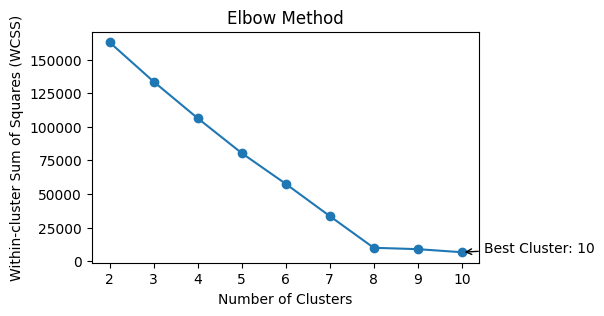

Best Number of Clusters: 10
Silhouette Score: 0.9686037630911007


(10, 0.9686037630911007)

In [51]:
X_subset = df[['view','bathroom_category']]
encoded_df = pd.get_dummies(X_subset, columns=['view','bathroom_category'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

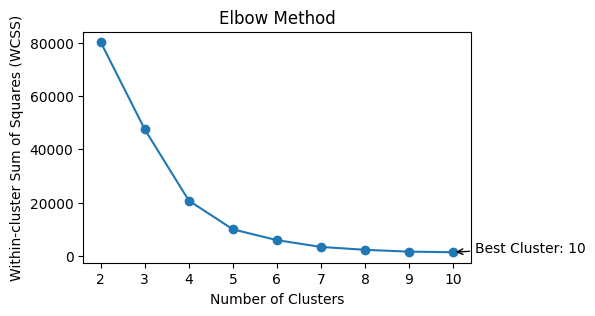

Best Number of Clusters: 10
Silhouette Score: 0.9624832010726787


(10, 0.9624832010726787)

In [53]:
X_subset = df[['view','bathroom_category']]
encoded_df = pd.get_dummies(X_subset, columns=['bathroom_category'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (8) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (8) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


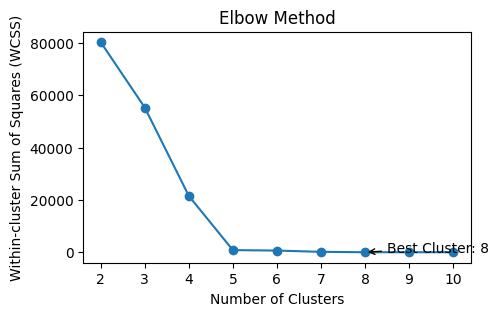

Best Number of Clusters: 8
Silhouette Score: 1.0


(8, 1.0)

In [54]:
X_subset = df[['waterfront','bathroom_category']]
encoded_df = pd.get_dummies(X_subset, columns=['bathroom_category'])
#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_subset_scaled = scaler.fit_transform(encoded_df)
kmeans_clustering_analysis(X_subset_scaled)

In [61]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

X_subset = df[['waterfront','bathroom_category']]

X_scaled = X_subset_scaled

# Apply K-Means clustering
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Calculate the silhouette score
silhouette_avg = silhouette_score(X_scaled, clusters)

# Print the silhouette score
print("The silhouette score is:", silhouette_avg)


The silhouette score is: 0.9668954458118516


In [70]:
import itertools
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler

def kmeans_clustering_combinations_2(X, categorical_cols, n_clusters_list=[2, 3, 4, 5]):
    """
    Perform K-means clustering analysis on every combination of two columns, both scaled and unscaled.

    Parameters:
    X (DataFrame): Input data to be clustered.
    categorical_cols (list): List of columns that are categorical.
    n_clusters_list (list): List of number of clusters for K-means.

    Returns:
    None
    """
    combinations = list(itertools.combinations(X.columns, 2))
    encoder = OneHotEncoder(sparse_output=False, drop='first')
    scaler = StandardScaler()

    for combo in combinations:
        X_combo = X[list(combo)].copy()
        
        for col in combo:
            if col in categorical_cols:
                encoded_col = encoder.fit_transform(X_combo[[col]])
                encoded_df = pd.DataFrame(encoded_col, columns=encoder.get_feature_names_out([col]))
                X_combo = X_combo.drop(columns=[col])
                X_combo = pd.concat([X_combo, encoded_df], axis=1)

        # Scale the data
        X_scaled = scaler.fit_transform(X_combo)

        print(f"Column combination: {combo}")
        
        for n_clusters in n_clusters_list:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            
            # Fit and predict for unscaled data
            cluster_labels_unscaled = kmeans.fit_predict(X_combo)
            silhouette_avg_unscaled = silhouette_score(X_combo, cluster_labels_unscaled)
            print(f"  Number of Clusters: {n_clusters} (Unscaled) | Silhouette Score: {silhouette_avg_unscaled:.4f}")
            print(f"  Cluster sizes (Unscaled): {pd.Series(cluster_labels_unscaled).value_counts().to_dict()}")

            # Fit and predict for scaled data
            cluster_labels_scaled = kmeans.fit_predict(X_scaled)
            silhouette_avg_scaled = silhouette_score(X_scaled, cluster_labels_scaled)
            print(f"  Number of Clusters: {n_clusters} (Scaled) | Silhouette Score: {silhouette_avg_scaled:.4f}")
            print(f"  Cluster sizes (Scaled): {pd.Series(cluster_labels_scaled).value_counts().to_dict()}")

            # Plot clusters
            plt.figure(figsize=(12, 6))

            plt.subplot(1, 2, 1)
            sns.scatterplot(x=X_combo.iloc[:, 0], y=X_combo.iloc[:, 1], hue=cluster_labels_unscaled, palette='viridis')
            plt.title(f'Clusters for {combo} (Unscaled) - {n_clusters} clusters')
            plt.xlabel(combo[0])
            plt.ylabel(combo[1])

            plt.subplot(1, 2, 2)
            sns.scatterplot(x=X_combo.iloc[:, 0], y=X_combo.iloc[:, 1], hue=cluster_labels_scaled, palette='viridis')
            plt.title(f'Clusters for {combo} (Scaled) - {n_clusters} clusters')
            plt.xlabel(combo[0])
            plt.ylabel(combo[1])

            plt.tight_layout()
            plt.show()

            # Plot latitude and longitude with cluster hue if lat and long columns are present
            if 'lat' in X.columns and 'long' in X.columns:
                X_combo['cluster_unscaled'] = cluster_labels_unscaled
                X_combo['cluster_scaled'] = cluster_labels_scaled
                X_combo['lat'] = X['lat']
                X_combo['long'] = X['long']

                plt.figure(figsize=(12, 6))

                plt.subplot(1, 2, 1)
                sns.scatterplot(x=X_combo['long'], y=X_combo['lat'], hue=X_combo['cluster_unscaled'], palette='viridis')
                plt.title(f'Lat/Long with Clusters (Unscaled) - {n_clusters} clusters')
                plt.xlabel('Longitude')
                plt.ylabel('Latitude')

                plt.subplot(1, 2, 2)
                sns.scatterplot(x=X_combo['long'], y=X_combo['lat'], hue=X_combo['cluster_scaled'], palette='viridis')
                plt.title(f'Lat/Long with Clusters (Scaled) - {n_clusters} clusters')
                plt.xlabel('Longitude')
                plt.ylabel('Latitude')

                plt.tight_layout()
                plt.show()

# Example usage:
# Assume df is your DataFrame and categorical_cols is the list of categorical columns
# kmeans_clustering_combinations(df, categorical_cols=['category_column1', 'category_column2'])


In [74]:
import itertools
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler

def save_results_to_csv(filename, result_dict):
    df_result = pd.DataFrame([result_dict])
    if not os.path.isfile(filename):
        df_result.to_csv(filename, index=False)
    else:
        df_result.to_csv(filename, mode='a', header=False, index=False)

def kmeans_clustering_combinations(X, categorical_cols, n_clusters_list=[2, 3, 4, 5], result_file='clustering_results.csv', graph_dir='clustering_graphs'):
    """
    Perform K-means clustering analysis on every combination of two or three columns, both scaled and unscaled,
    and save the results and graphs.

    Parameters:
    X (DataFrame): Input data to be clustered.
    categorical_cols (list): List of columns that are categorical.
    n_clusters_list (list): List of number of clusters for K-means.
    result_file (str): File to save the clustering results.
    graph_dir (str): Directory to save the clustering graphs.

    Returns:
    None
    """
    combinations = list(itertools.combinations(X.columns, 2)) + list(itertools.combinations(X.columns, 3))
    encoder = OneHotEncoder(sparse_output=False, drop='first')
    scaler = StandardScaler()

    if not os.path.exists(graph_dir):
        os.makedirs(graph_dir)

    for combo in combinations:
        X_combo = X[list(combo)].copy()
        
        for col in combo:
            if col in categorical_cols:
                encoded_col = encoder.fit_transform(X_combo[[col]])
                encoded_df = pd.DataFrame(encoded_col, columns=encoder.get_feature_names_out([col]))
                X_combo = X_combo.drop(columns=[col])
                X_combo = pd.concat([X_combo, encoded_df], axis=1)

        # Scale the data
        X_scaled = scaler.fit_transform(X_combo)

        for n_clusters in n_clusters_list:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            
            # Fit and predict for unscaled data
            cluster_labels_unscaled = kmeans.fit_predict(X_combo)
            silhouette_avg_unscaled = silhouette_score(X_combo, cluster_labels_unscaled)
            result_unscaled = {
                'Combination': combo,
                'N_Clusters': n_clusters,
                'Scale_Type': 'Unscaled',
                'Silhouette_Score': silhouette_avg_unscaled,
                'Cluster_Sizes': pd.Series(cluster_labels_unscaled).value_counts().to_dict()
            }
            save_results_to_csv(result_file, result_unscaled)

            if silhouette_avg_unscaled > 0.85:
                plt.figure(figsize=(12, 6))
                sns.scatterplot(x=X_combo.iloc[:, 0], y=X_combo.iloc[:, 1], hue=cluster_labels_unscaled, palette='viridis')
                plt.title(f'Clusters for {combo} (Unscaled) - {n_clusters} clusters')
                plt.xlabel(combo[0])
                plt.ylabel(combo[1])
                graph_path = os.path.join(graph_dir, f"unscaled_{'_'.join(combo)}_{n_clusters}.png")
                plt.savefig(graph_path)
                plt.close()

            # Fit and predict for scaled data
            cluster_labels_scaled = kmeans.fit_predict(X_scaled)
            silhouette_avg_scaled = silhouette_score(X_scaled, cluster_labels_scaled)
            result_scaled = {
                'Combination': combo,
                'N_Clusters': n_clusters,
                'Scale_Type': 'Scaled',
                'Silhouette_Score': silhouette_avg_scaled,
                'Cluster_Sizes': pd.Series(cluster_labels_scaled).value_counts().to_dict()
            }
            save_results_to_csv(result_file, result_scaled)

            if silhouette_avg_scaled > 0.85:
                plt.figure(figsize=(12, 6))
                sns.scatterplot(x=X_combo.iloc[:, 0], y=X_combo.iloc[:, 1], hue=cluster_labels_scaled, palette='viridis')
                plt.title(f'Clusters for {combo} (Scaled) - {n_clusters} clusters')
                plt.xlabel(combo[0])
                plt.ylabel(combo[1])
                graph_path = os.path.join(graph_dir, f"scaled_{'_'.join(combo)}_{n_clusters}.png")
                plt.savefig(graph_path)
                plt.close()

            # Plot latitude and longitude with cluster hue if lat and long columns are present
            if 'lat' in X.columns and 'long' in X.columns:
                X_combo['cluster_unscaled'] = cluster_labels_unscaled
                X_combo['cluster_scaled'] = cluster_labels_scaled
                X_combo['lat'] = X['lat']
                X_combo['long'] = X['long']

                if silhouette_avg_unscaled > 0.85:
                    plt.figure(figsize=(12, 6))
                    sns.scatterplot(x=X_combo['long'], y=X_combo['lat'], hue=X_combo['cluster_unscaled'], palette='viridis')
                    plt.title(f'Lat/Long with Clusters (Unscaled) - {n_clusters} clusters')
                    plt.xlabel('Longitude')
                    plt.ylabel('Latitude')
                    graph_path = os.path.join(graph_dir, f"unscaled_latlong_{'_'.join(combo)}_{n_clusters}.png")
                    plt.savefig(graph_path)
                    plt.close()

                if silhouette_avg_scaled > 0.85:
                    plt.figure(figsize=(12, 6))
                    sns.scatterplot(x=X_combo['long'], y=X_combo['lat'], hue=X_combo['cluster_scaled'], palette='viridis')
                    plt.title(f'Lat/Long with Clusters (Scaled) - {n_clusters} clusters')
                    plt.xlabel('Longitude')
                    plt.ylabel('Latitude')
                    graph_path = os.path.join(graph_dir, f"scaled_latlong_{'_'.join(combo)}_{n_clusters}.png")
                    plt.savefig(graph_path)
                    plt.close()

# Example usage:
# Assume df is your DataFrame and categorical_cols is the list of categorical columns
# kmeans_clustering_combinations(df, categorical_cols=['category_column1', 'category_column2'])


In [75]:
kmeans_clustering_combinations(df.drop(columns=['price']), categorical_cols=cat_cols)

/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


## best parameters

In [ ]:
combinations = [
    (('waterfront', 'is_near_shore'), 2, 'Scaled'),
    (('sqft_lot', 'is_near_shore'), 2, 'Scaled'),
    (('sqft_lot', 'yr_renovated', 'is_near_shore'), 3, 'Scaled'),
    (('view', 'is_near_shore'), 2, 'Unscaled'),
    (('long', 'is_near_shore'), 2, 'Unscaled'),
    (('lat', 'is_near_shore'), 2, 'Unscaled'),
    (('waterfront', 'condition', 'long'), 3, 'Unscaled'),
    (('waterfront', 'condition'), 2, 'Unscaled'),
    (('sqft_lot', 'waterfront', 'condition'), 3, 'Scaled'),
    (('lat', 'long', 'is_near_shore'), 3, 'Unscaled'),
    (('waterfront', 'lat', 'long'), 3, 'Unscaled'),
    (('floors', 'waterfront'), 2, 'Unscaled'),
    (('yr_renovated', 'is_near_shore'), 2, 'Scaled')
]

Features: ('waterfront', 'is_near_shore')
KMeans Silhouette Score: 0.9676351809932462
DBSCAN Silhouette Score: 1.0
KMeans clustering for features: ('waterfront', 'is_near_shore')


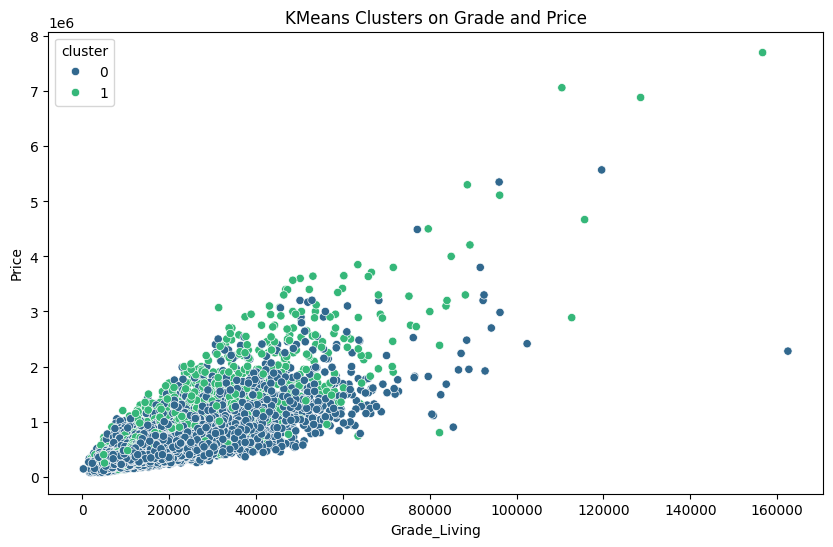

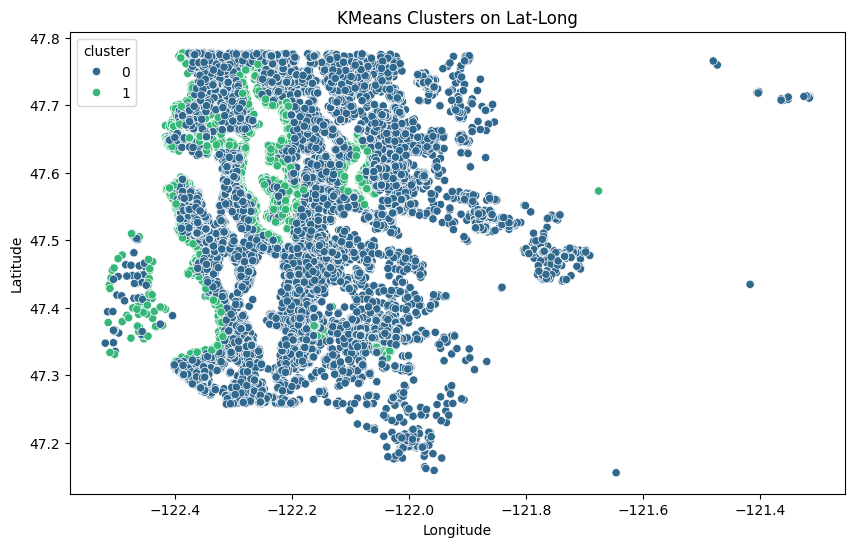

DBSCAN clustering for features: ('waterfront', 'is_near_shore')


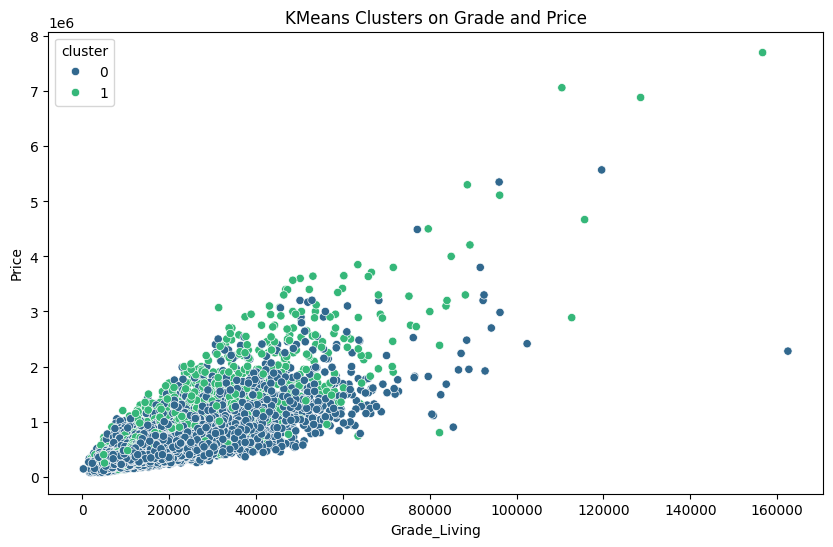

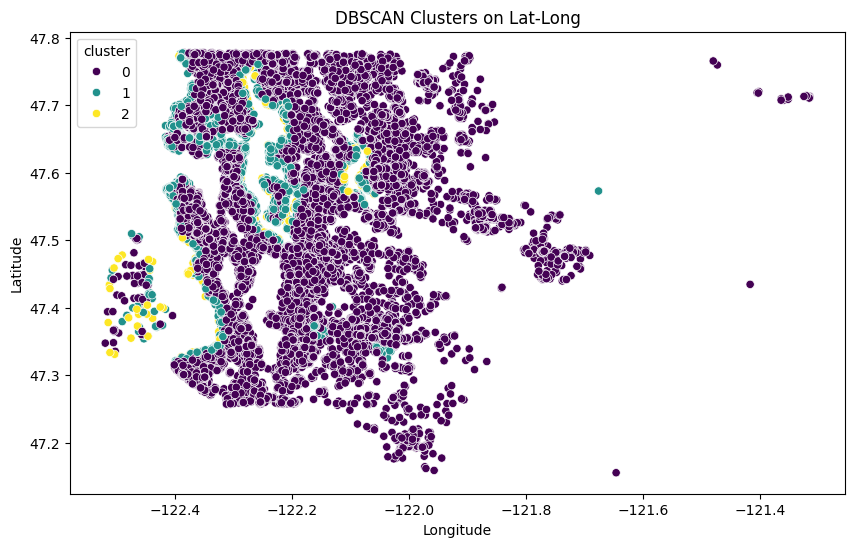

Features: ('sqft_lot', 'is_near_shore')
KMeans Silhouette Score: 0.8854021492691647
DBSCAN Silhouette Score: 0.8862877422421584
KMeans clustering for features: ('sqft_lot', 'is_near_shore')


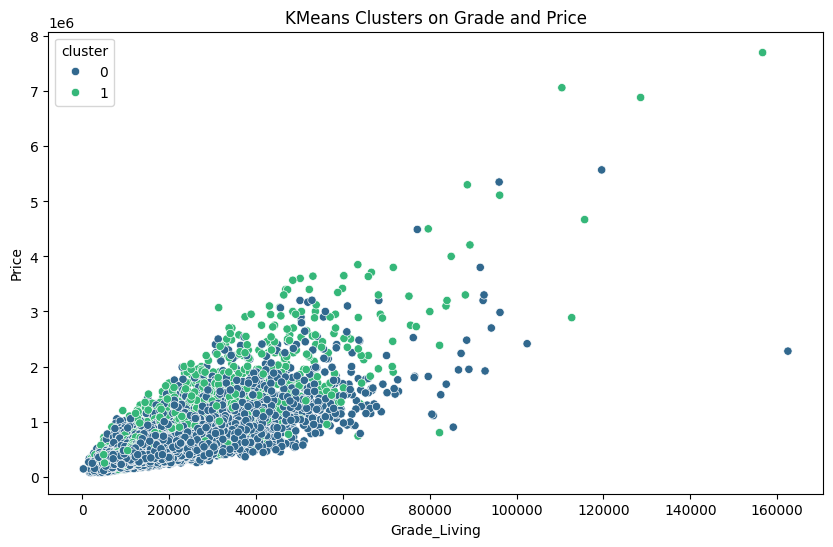

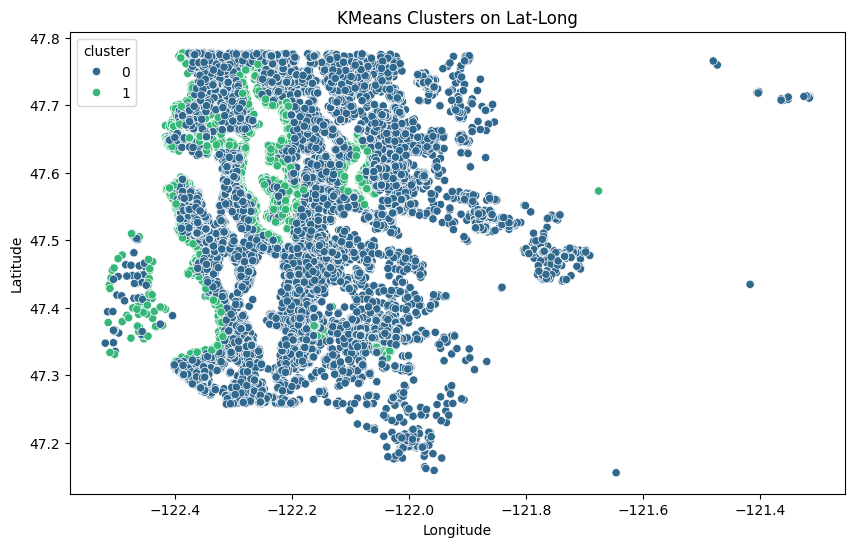

DBSCAN clustering for features: ('sqft_lot', 'is_near_shore')


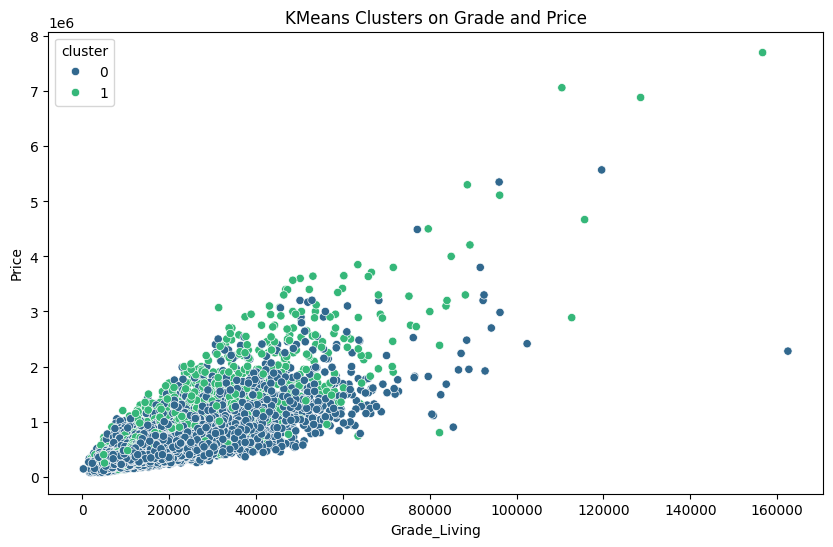

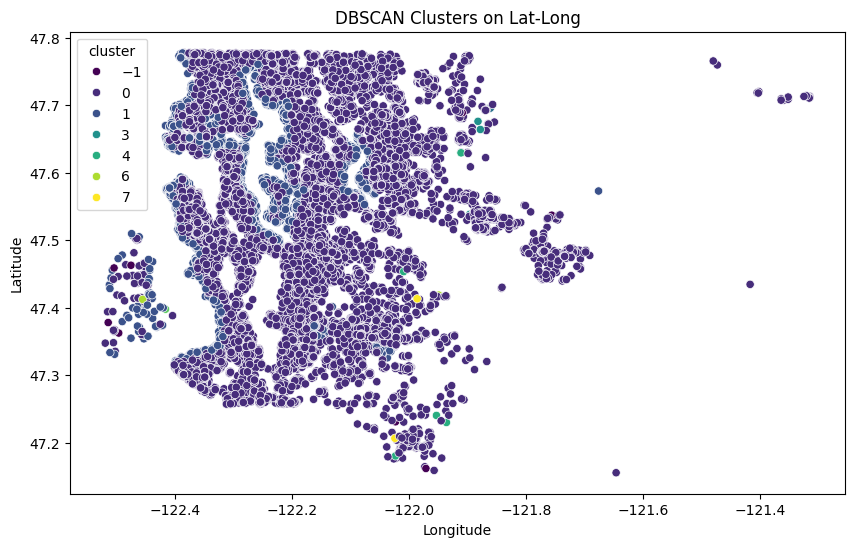

Features: ('sqft_lot', 'yr_renovated', 'is_near_shore')
KMeans Silhouette Score: 0.8773925341013866
DBSCAN Silhouette Score: 0.8865189634439558
KMeans clustering for features: ('sqft_lot', 'yr_renovated', 'is_near_shore')


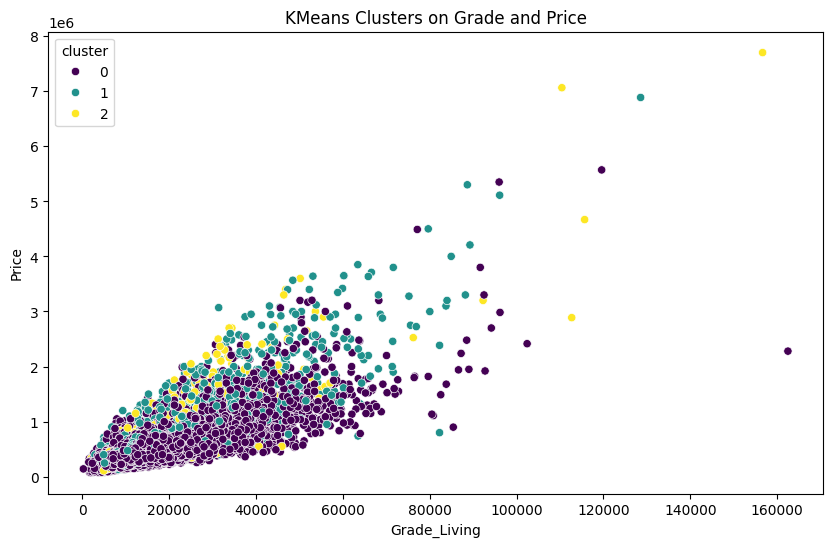

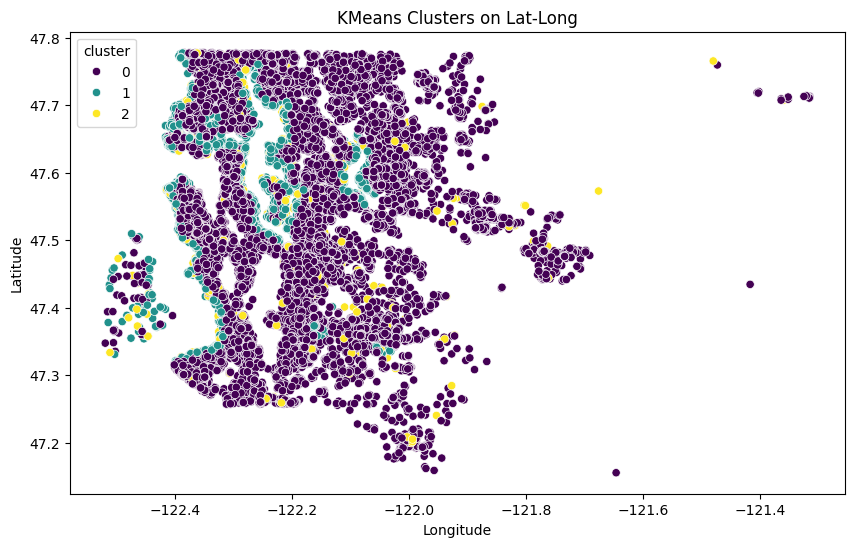

DBSCAN clustering for features: ('sqft_lot', 'yr_renovated', 'is_near_shore')


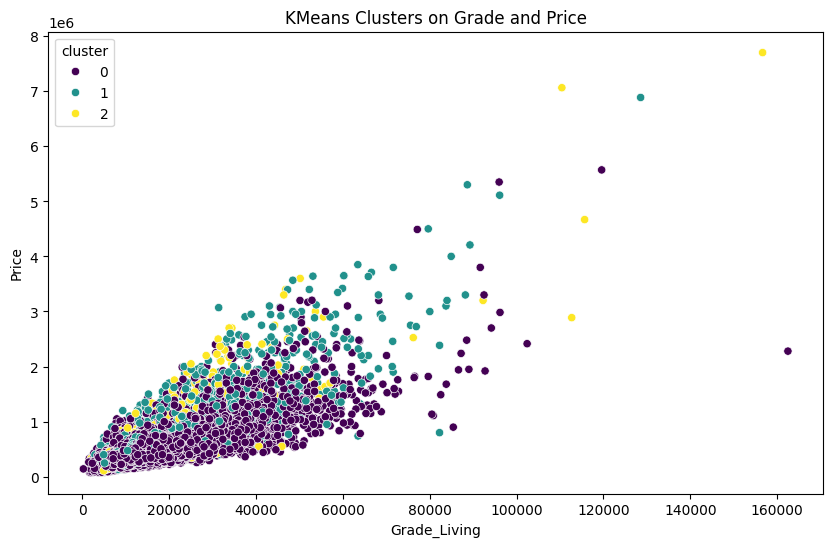

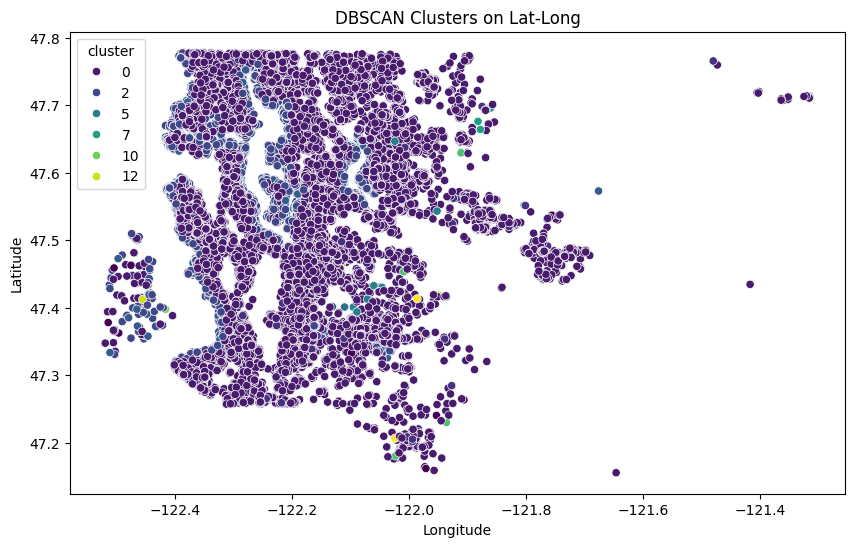

Features: ('view', 'is_near_shore')
KMeans Silhouette Score: 0.9052568315893615
DBSCAN Silhouette Score: 1.0
KMeans clustering for features: ('view', 'is_near_shore')


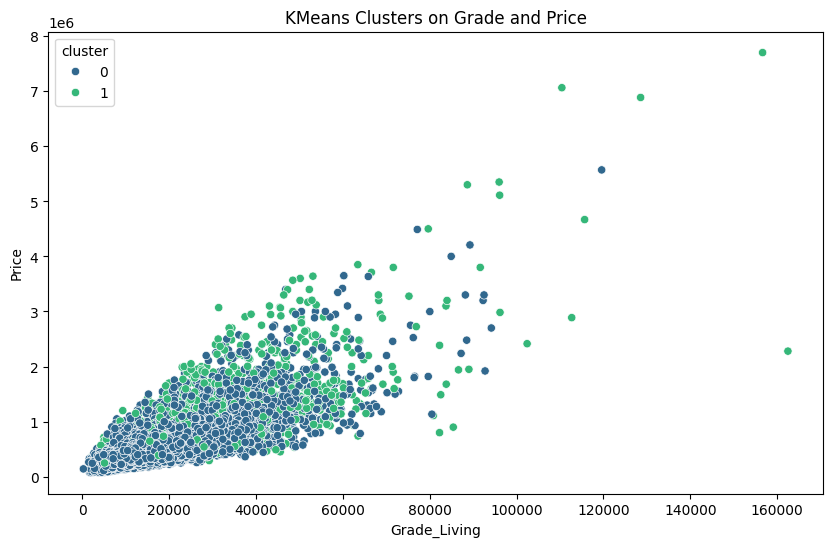

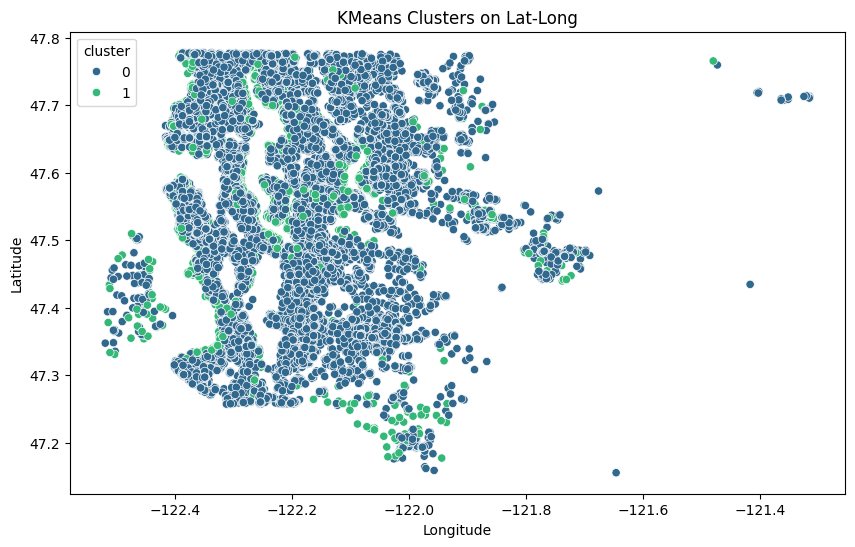

DBSCAN clustering for features: ('view', 'is_near_shore')


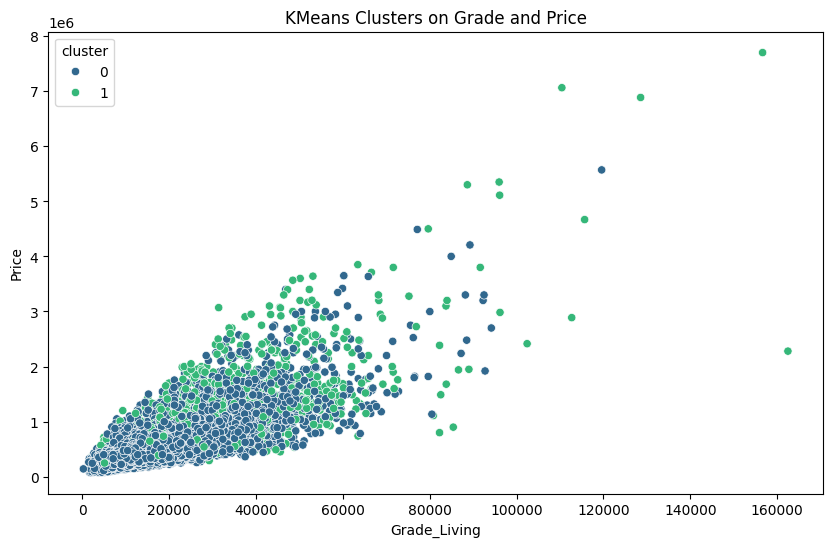

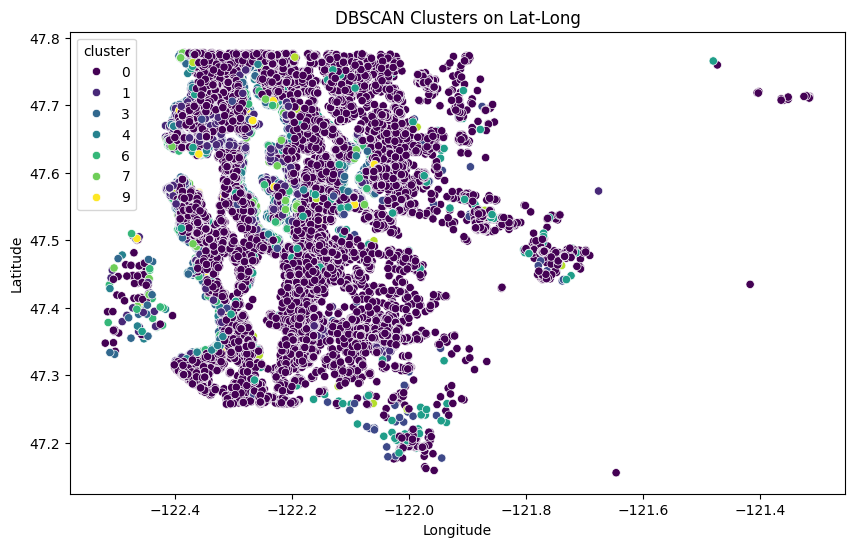

Features: ('long', 'is_near_shore')
KMeans Silhouette Score: 0.8506262634634343
DBSCAN Silhouette Score: 0.8506262634634343
KMeans clustering for features: ('long', 'is_near_shore')


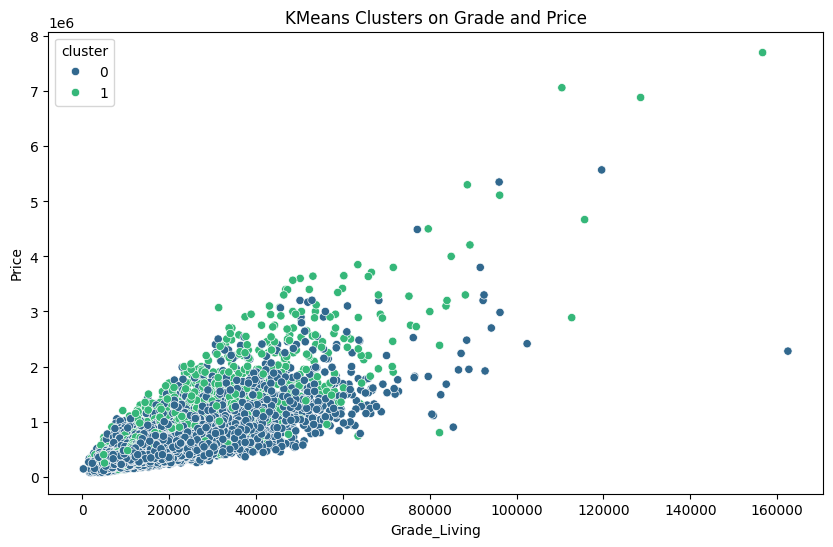

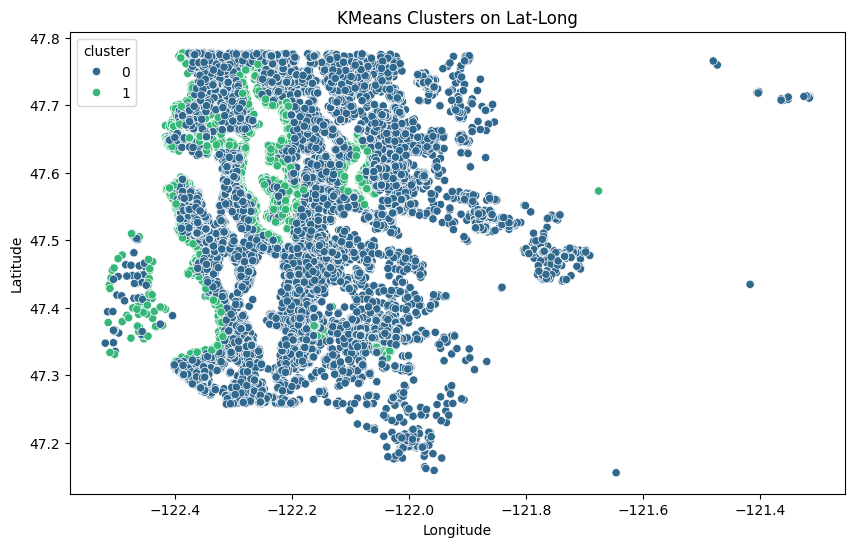

DBSCAN clustering for features: ('long', 'is_near_shore')


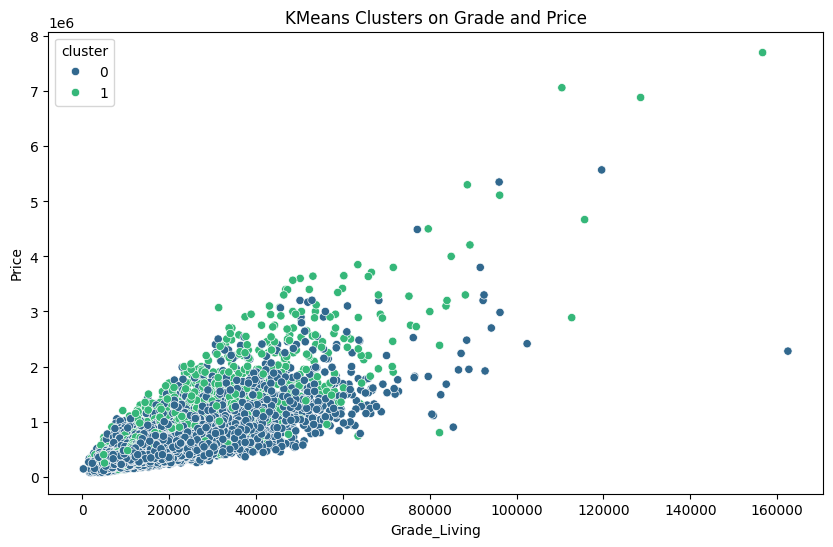

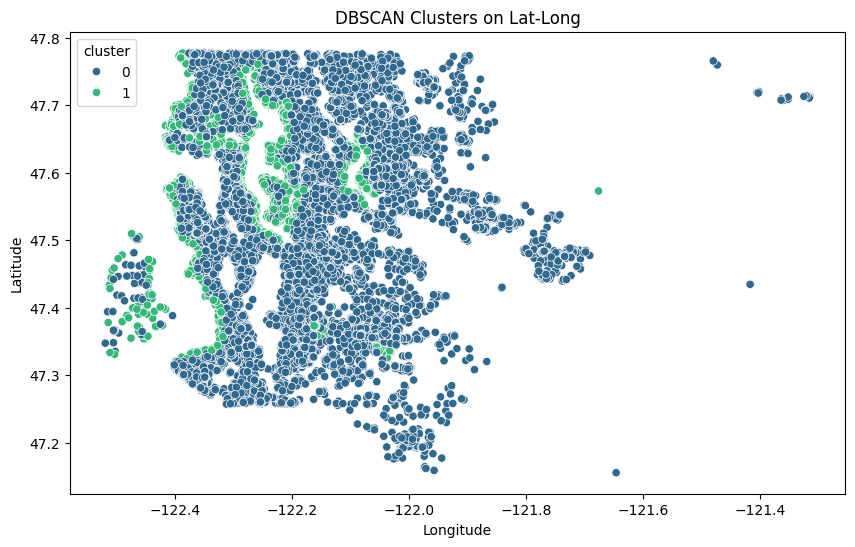

Features: ('lat', 'is_near_shore')
KMeans Silhouette Score: 0.8465769089157048
DBSCAN Silhouette Score: 0.8465769089157048
KMeans clustering for features: ('lat', 'is_near_shore')


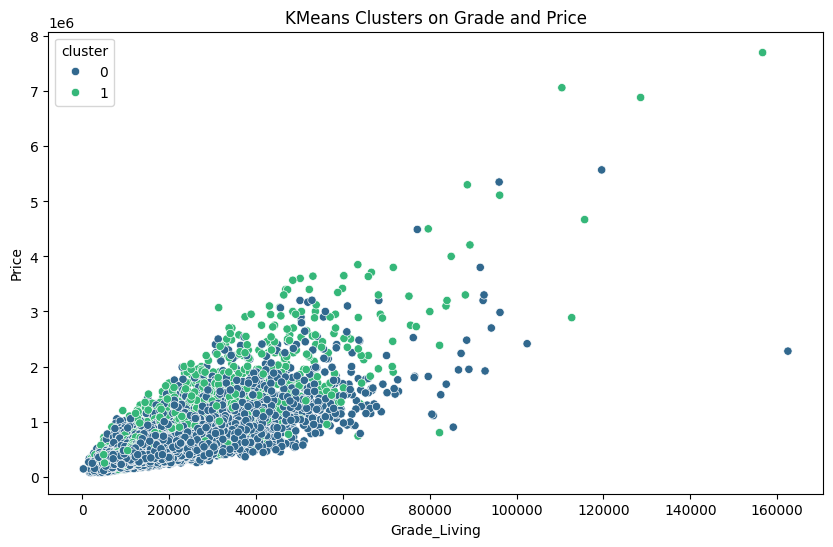

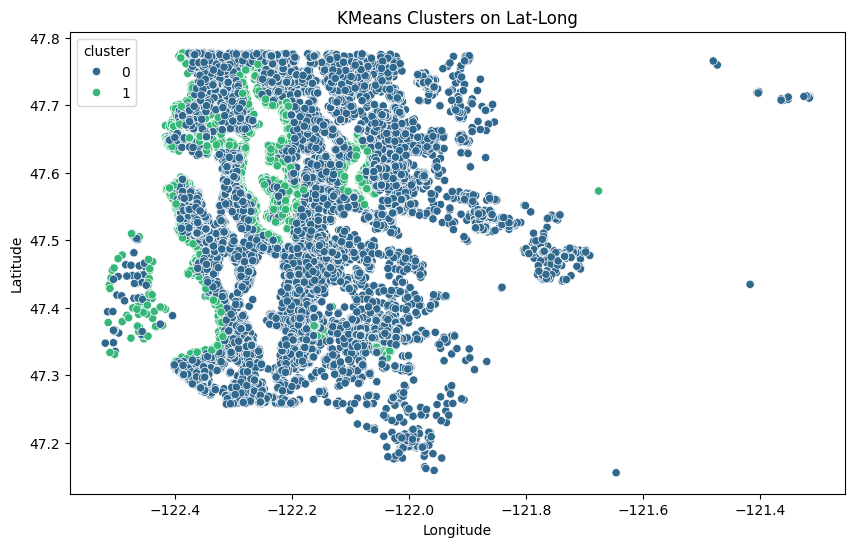

DBSCAN clustering for features: ('lat', 'is_near_shore')


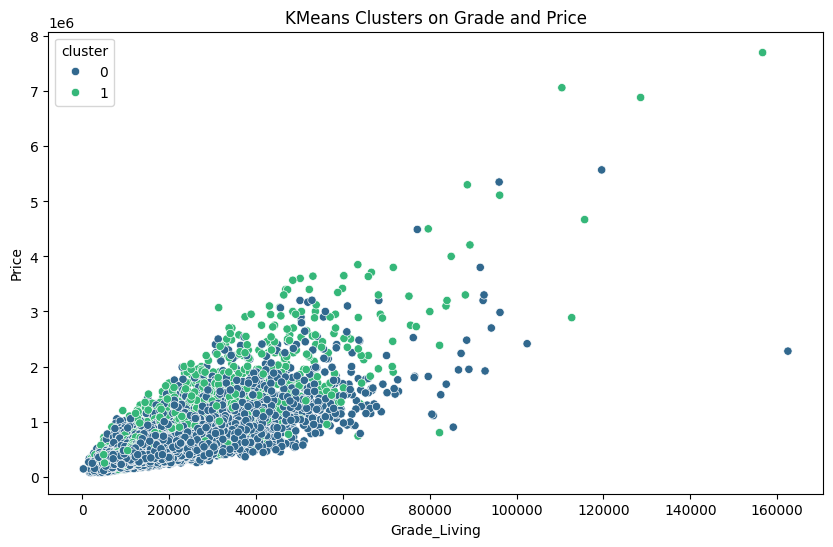

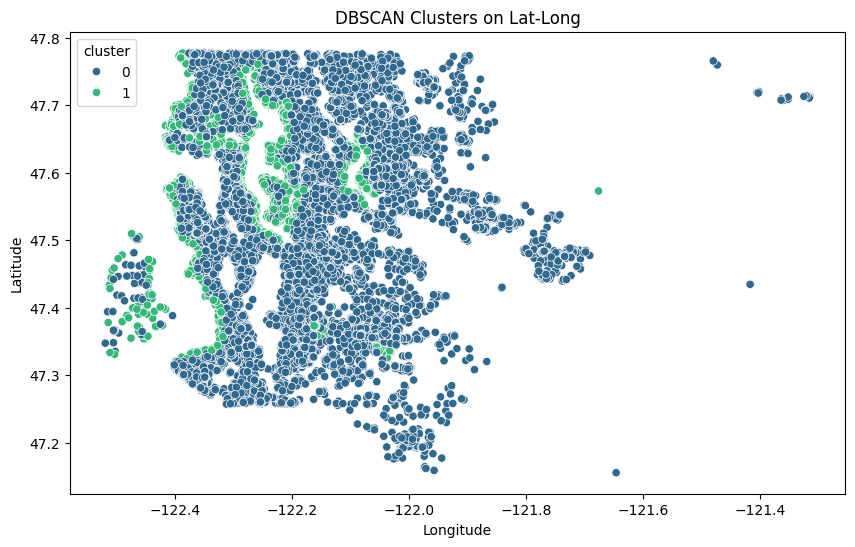

Features: ('waterfront', 'condition', 'long')
KMeans Silhouette Score: 0.8265369879075277
DBSCAN Silhouette Score: 0.8486803852588483
KMeans clustering for features: ('waterfront', 'condition', 'long')


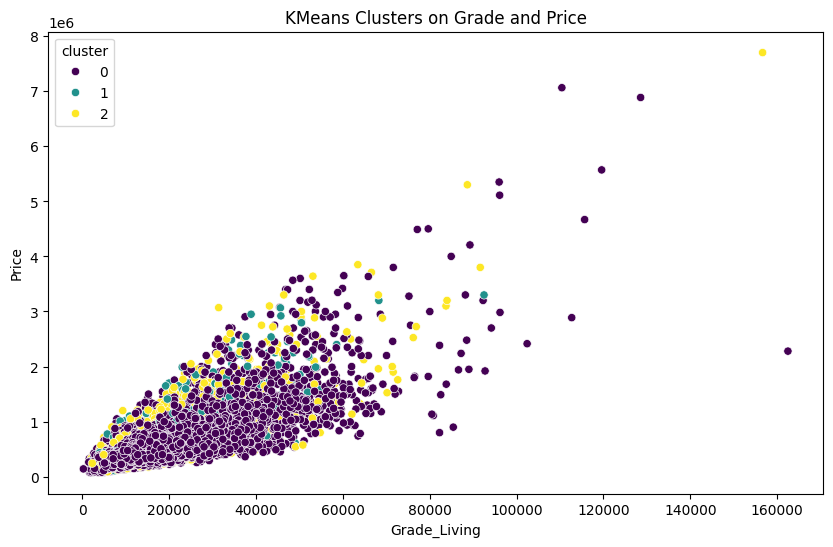

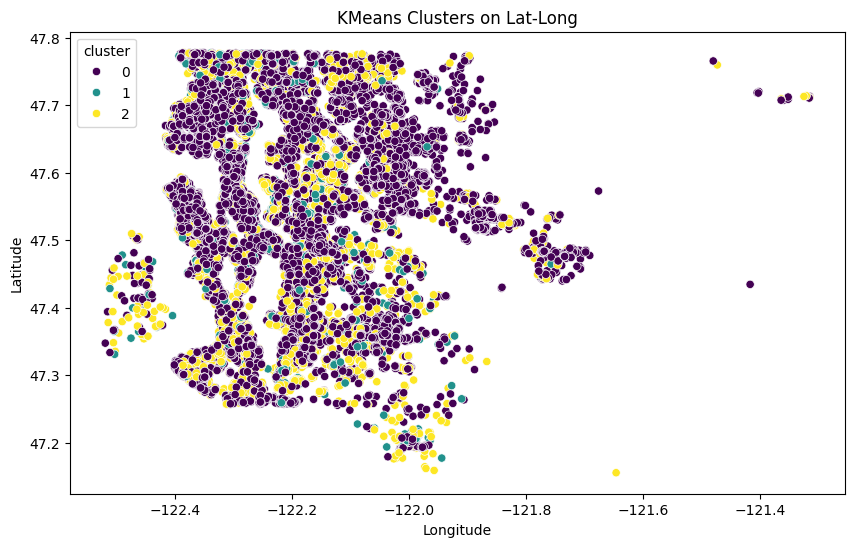

DBSCAN clustering for features: ('waterfront', 'condition', 'long')


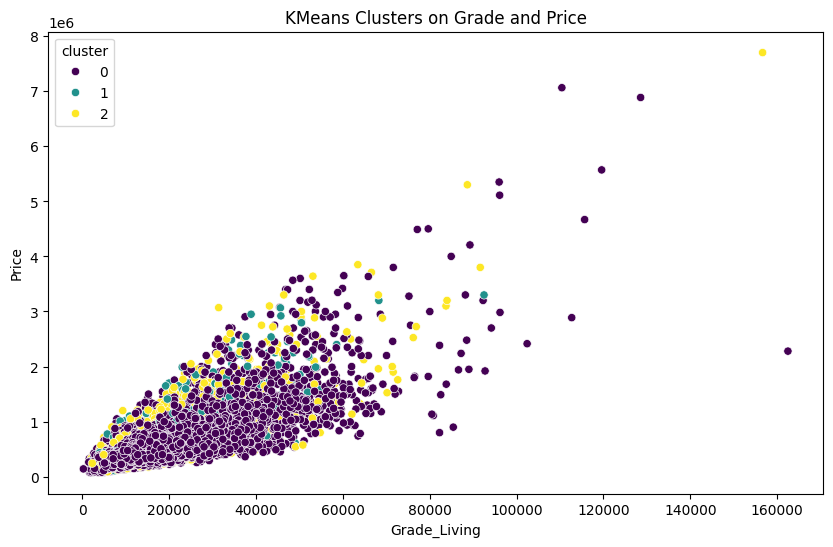

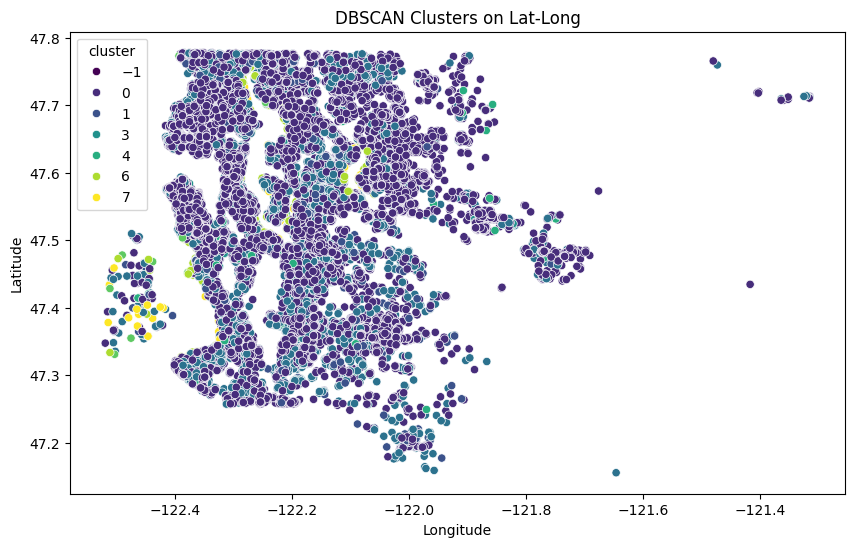

Features: ('waterfront', 'condition')
KMeans Silhouette Score: 0.8879645694948824
DBSCAN Silhouette Score: 0.9999074631009115
KMeans clustering for features: ('waterfront', 'condition')


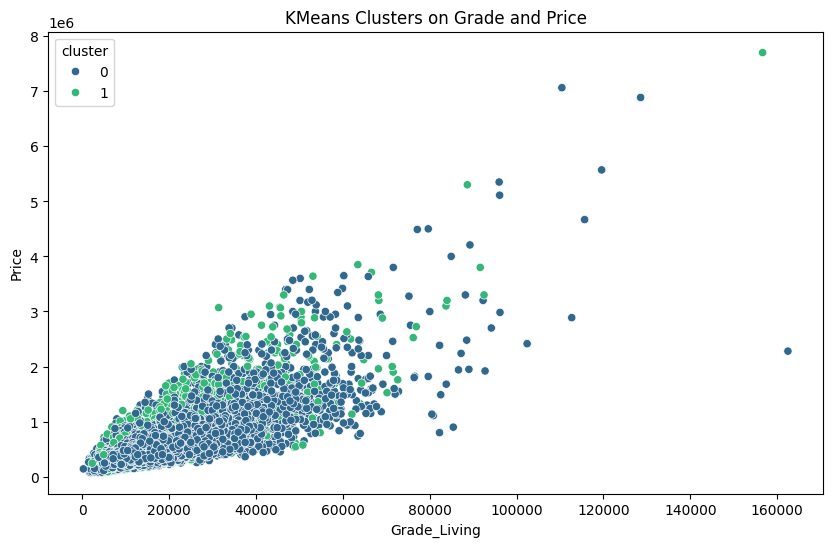

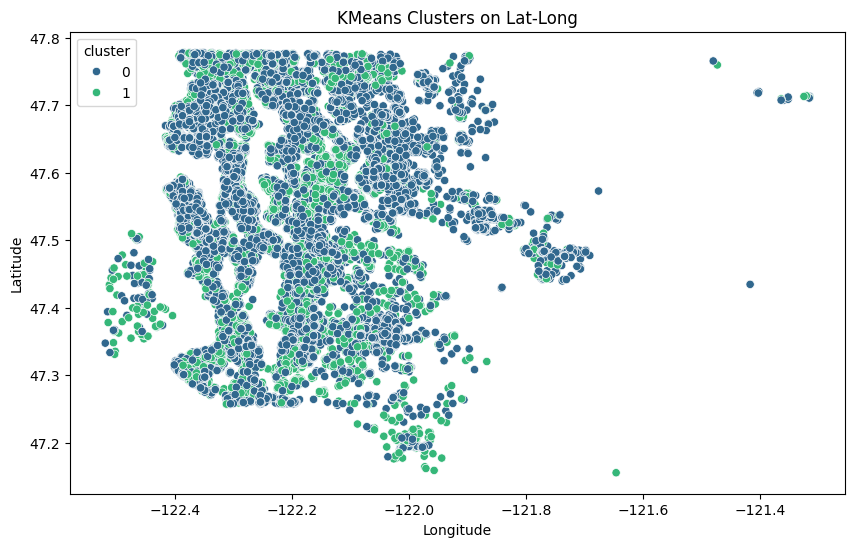

DBSCAN clustering for features: ('waterfront', 'condition')


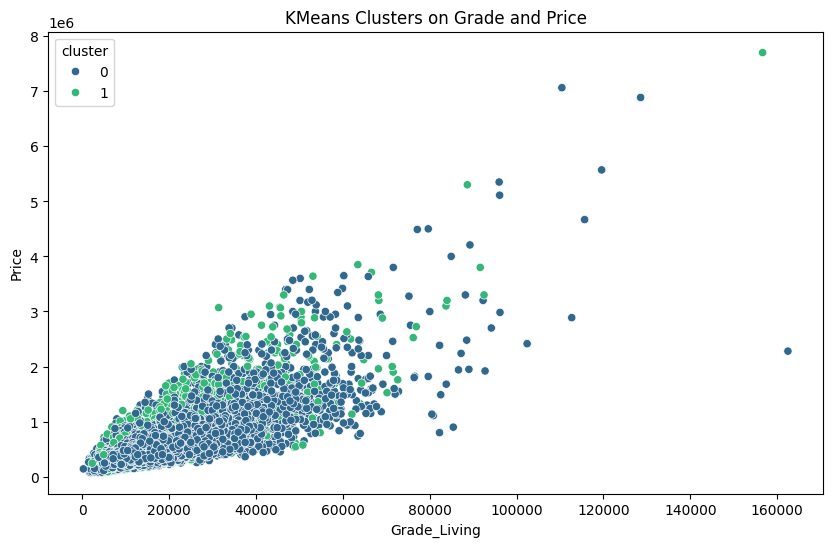

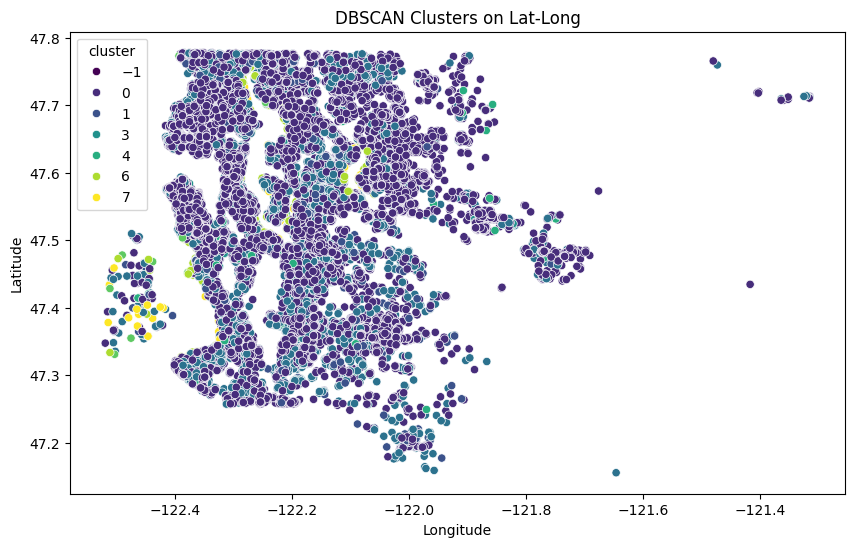

Features: ('sqft_lot', 'waterfront', 'condition')
KMeans Silhouette Score: 0.7422199064237452
DBSCAN Silhouette Score: 0.7939354687685195
KMeans clustering for features: ('sqft_lot', 'waterfront', 'condition')


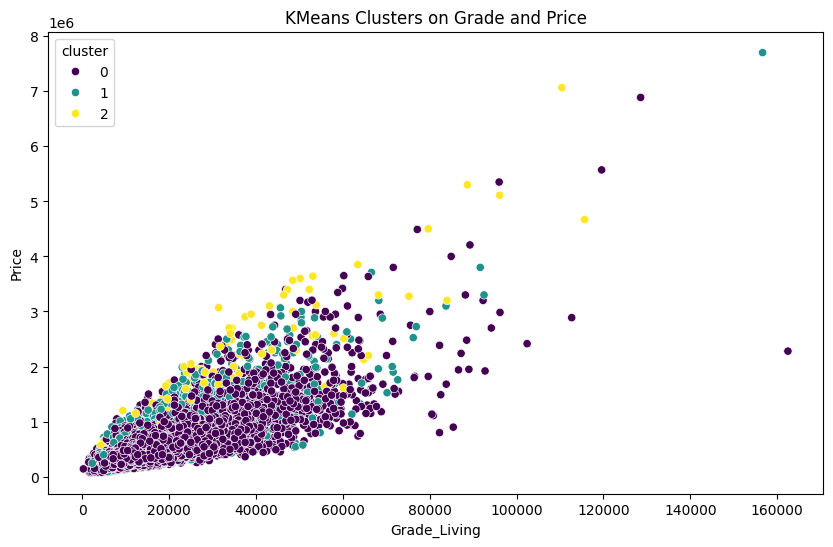

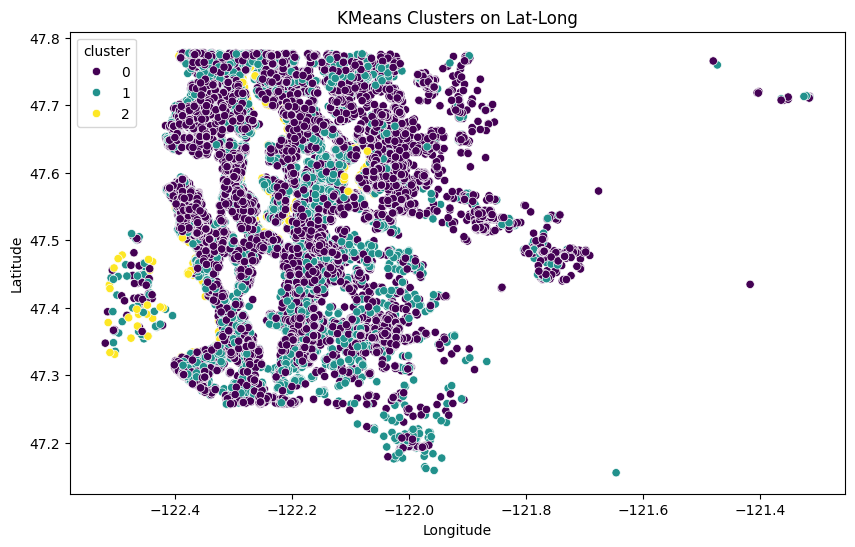

DBSCAN clustering for features: ('sqft_lot', 'waterfront', 'condition')


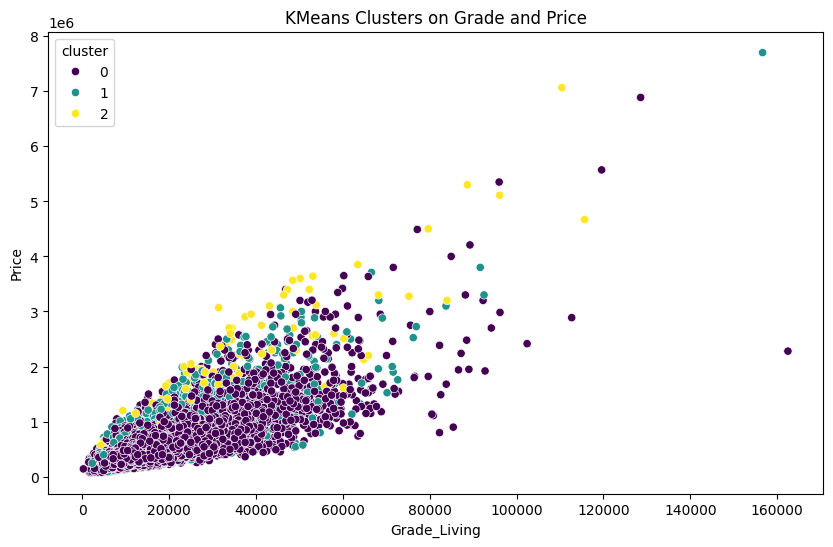

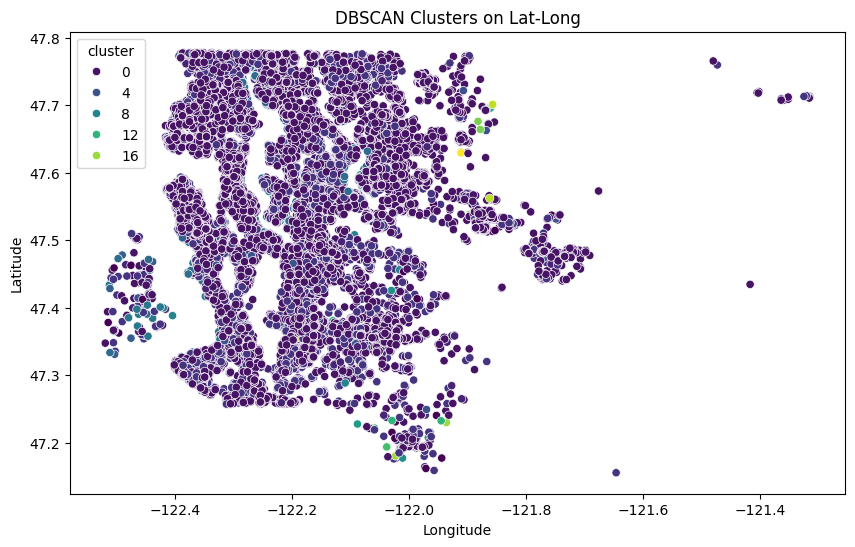

Features: ('lat', 'long', 'is_near_shore')
KMeans Silhouette Score: 0.4303271652420932
DBSCAN Silhouette Score: 0.7651094717610222
KMeans clustering for features: ('lat', 'long', 'is_near_shore')


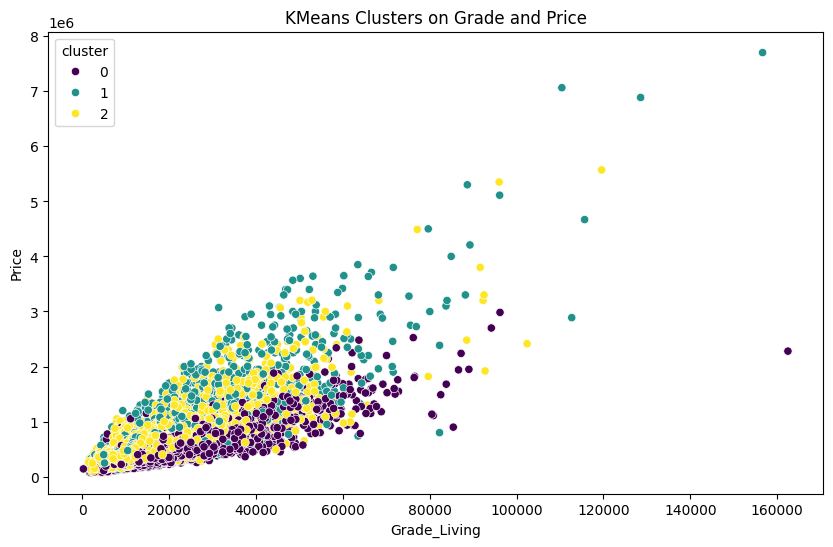

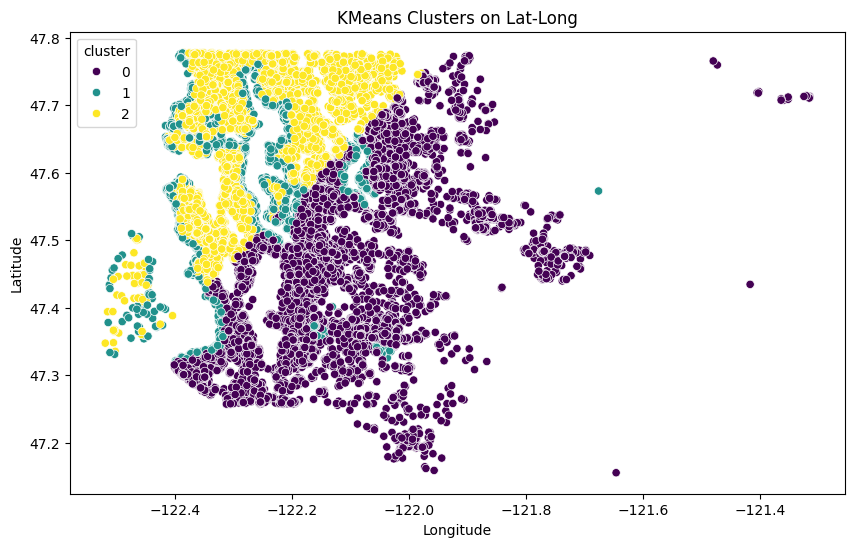

DBSCAN clustering for features: ('lat', 'long', 'is_near_shore')


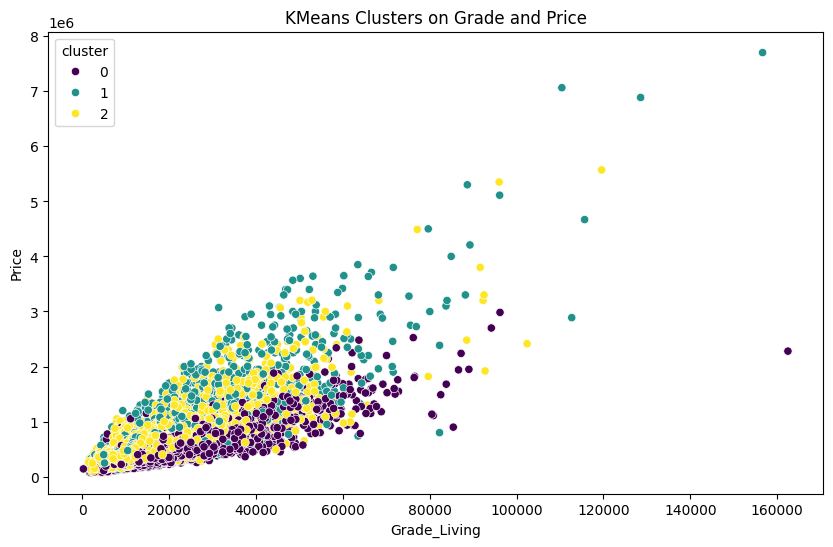

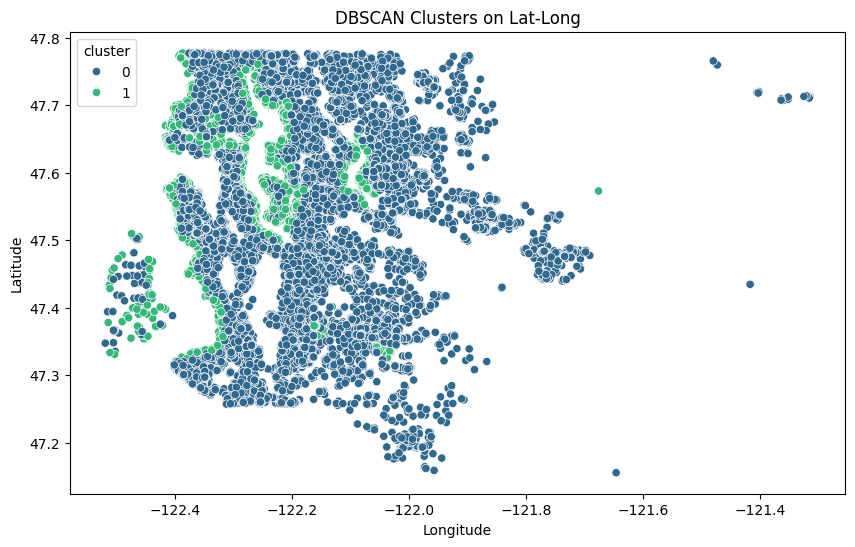

Features: ('waterfront', 'lat', 'long')
KMeans Silhouette Score: 0.38747489169211224
DBSCAN Silhouette Score: 0.7628220397406617
KMeans clustering for features: ('waterfront', 'lat', 'long')


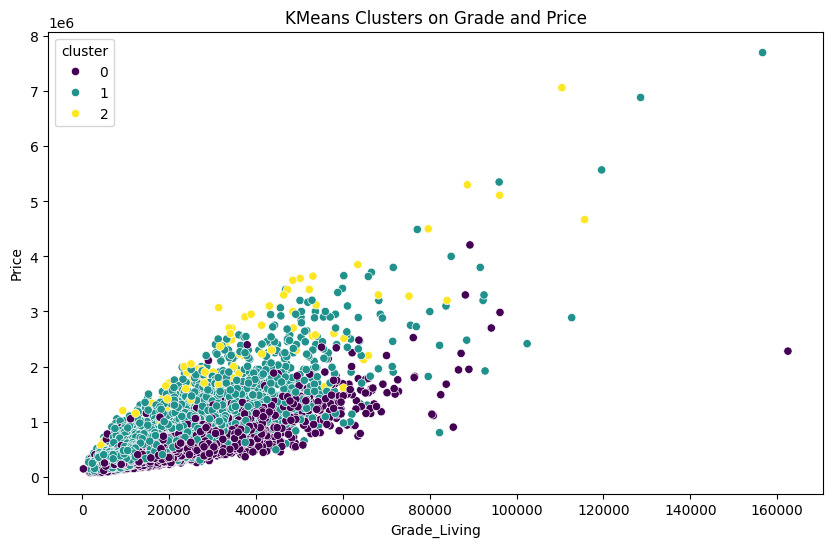

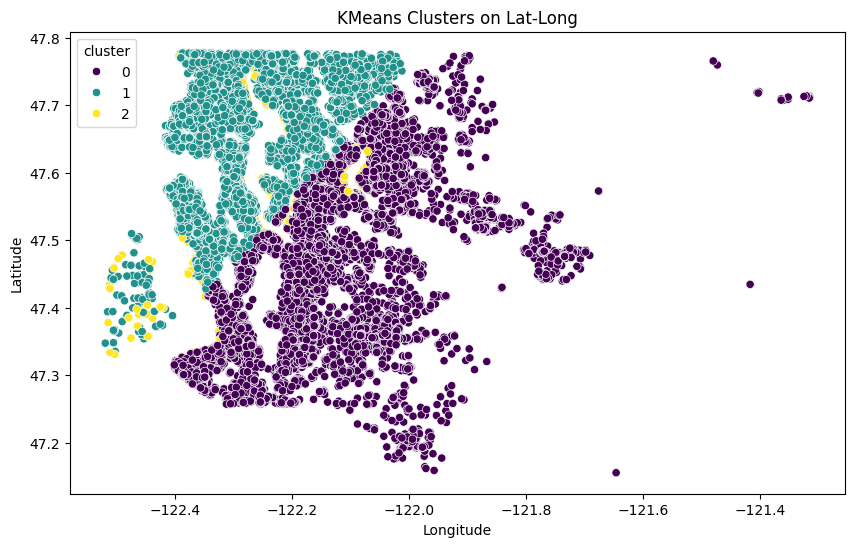

DBSCAN clustering for features: ('waterfront', 'lat', 'long')


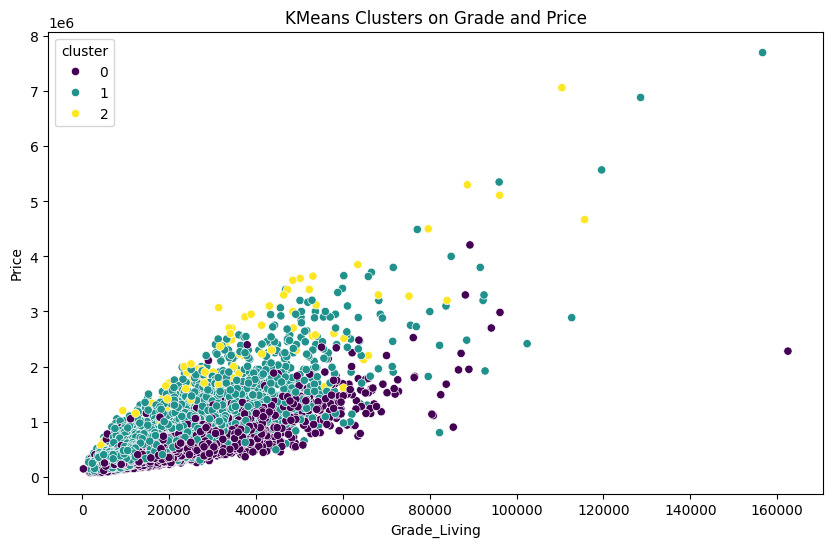

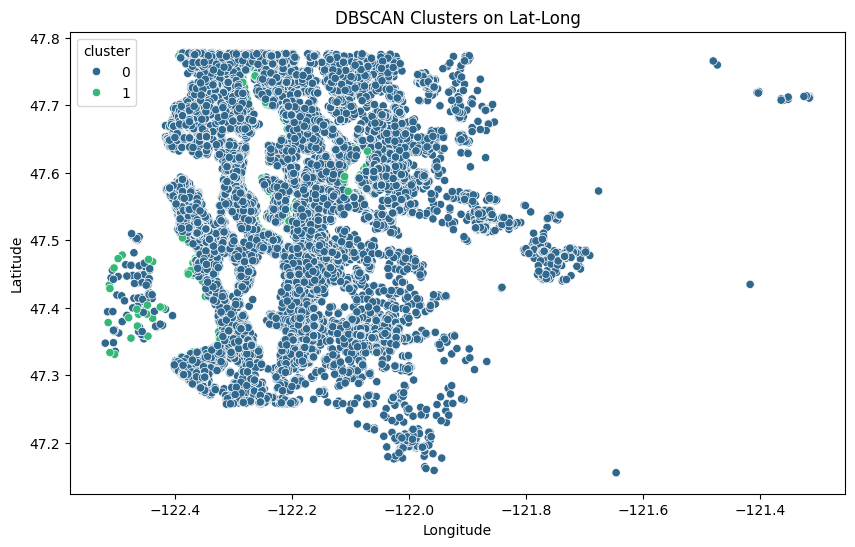

Features: ('floors', 'waterfront')
KMeans Silhouette Score: 0.8414853985544163
DBSCAN Silhouette Score: 0.5560881151980984
KMeans clustering for features: ('floors', 'waterfront')


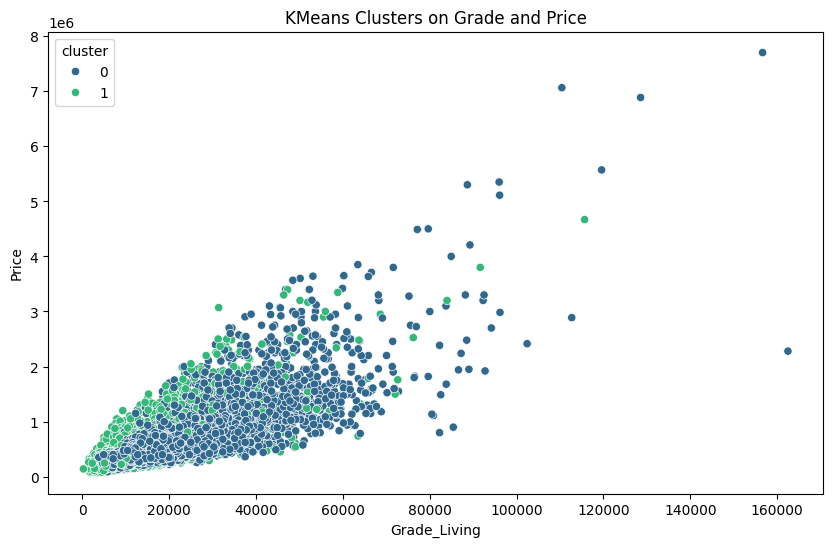

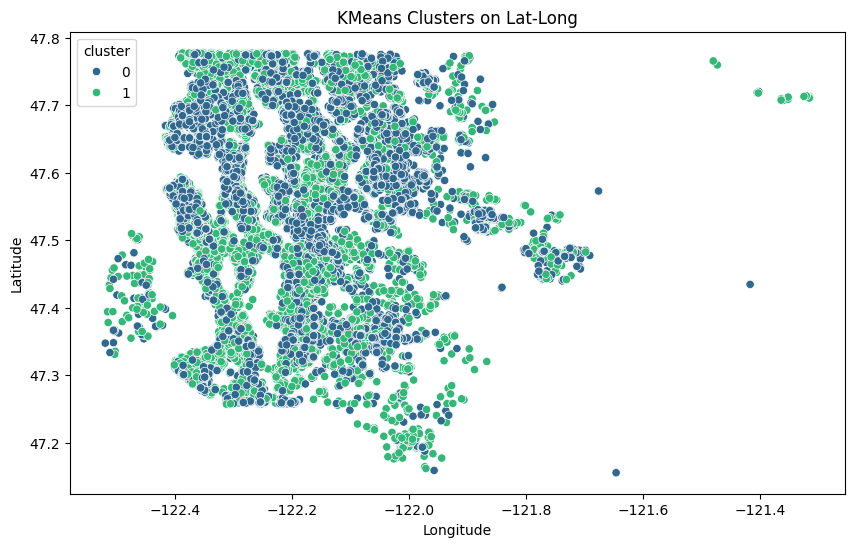

DBSCAN clustering for features: ('floors', 'waterfront')


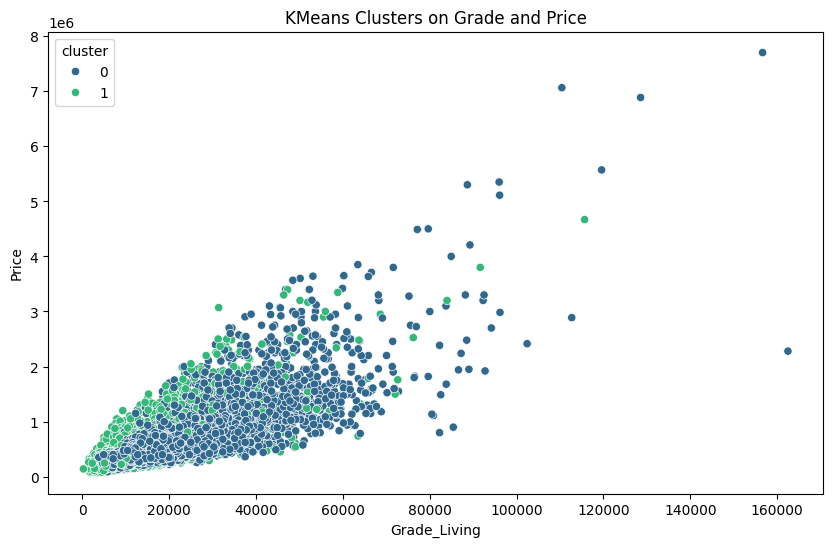

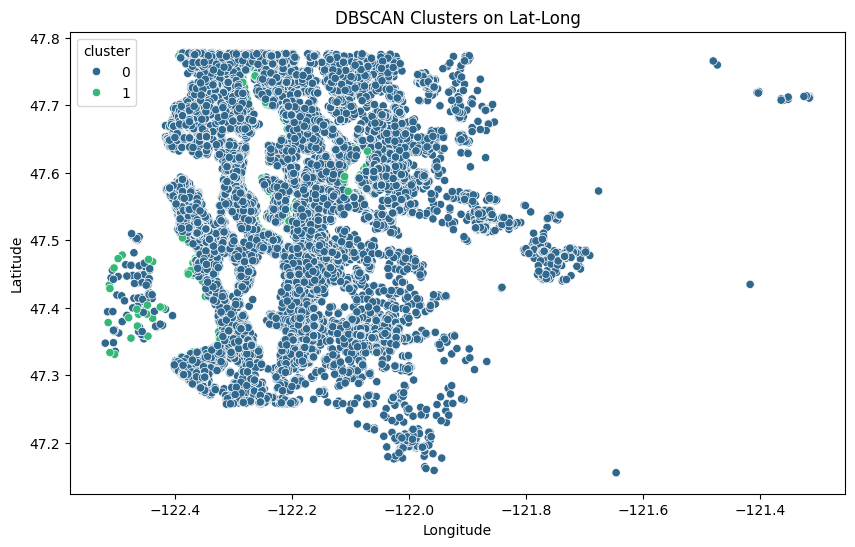

Features: ('yr_renovated', 'is_near_shore')
KMeans Silhouette Score: 0.906649706525382
DBSCAN Silhouette Score: 0.9994411179013025
KMeans clustering for features: ('yr_renovated', 'is_near_shore')


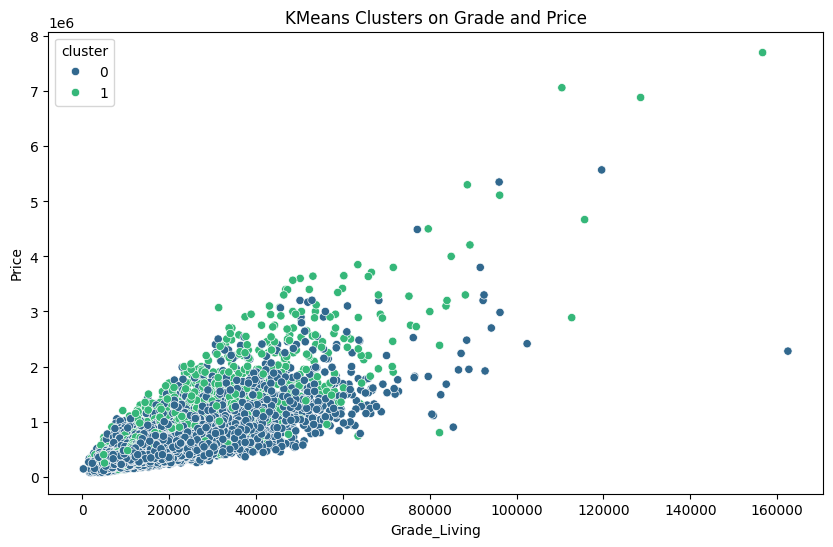

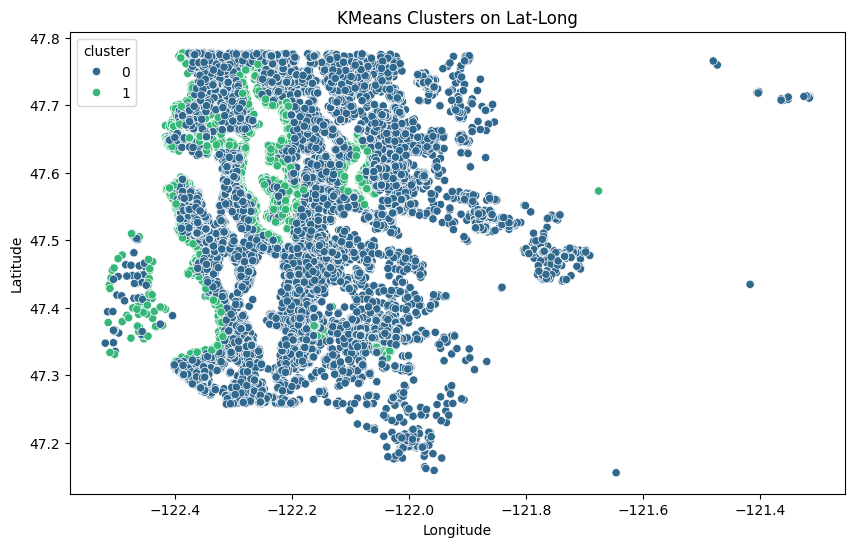

DBSCAN clustering for features: ('yr_renovated', 'is_near_shore')


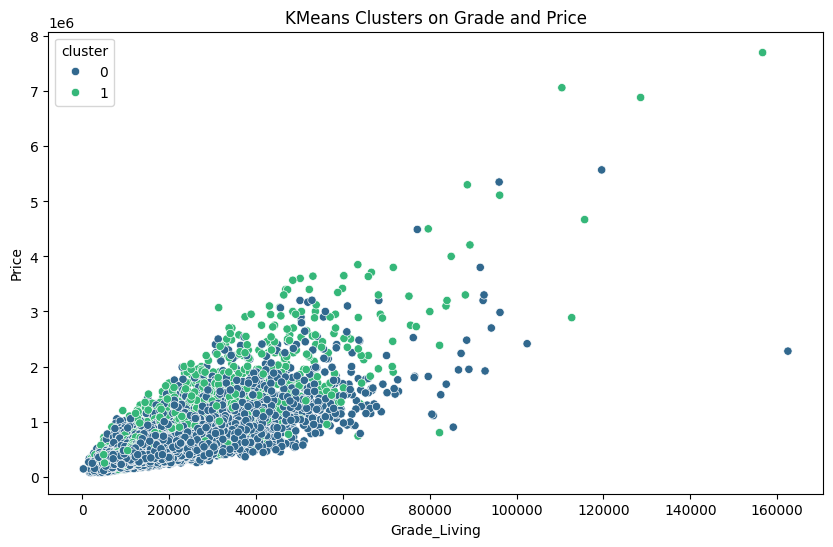

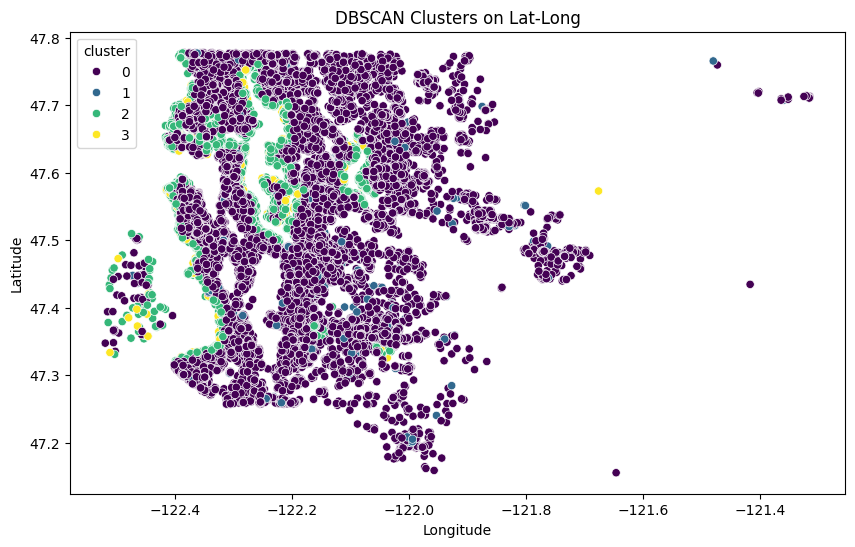

In [81]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns



# Function to plot price distribution over clusters
def plot_price_distribution(df, labels, algorithm_name):
    df['cluster'] = labels
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='cluster', y='price', data=df)
    plt.title(f'Price Distribution over {algorithm_name} Clusters')
    plt.show()

# Function to plot clusters on a scatter plot using lat and long
def plot_clusters_lat_long(df, labels, algorithm_name):
    df['cluster'] = labels
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='long', y='lat', hue='cluster', palette='viridis', data=df)
    plt.title(f'{algorithm_name} Clusters on Lat-Long')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

    # Function to plot clusters on a scatter plot using lat and long
def plot_clusters_grade_price(df, labels, algorithm_name):
    df['cluster'] = labels
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='grade_living', y='price', hue='cluster', palette='viridis', data=df)
    plt.title(f'{algorithm_name} Clusters on Grade and Price')
    plt.xlabel('Grade_Living')
    plt.ylabel('Price')
    plt.show()

# Define the combinations
combinations = [
    (('waterfront', 'is_near_shore'), 2, 'Scaled'),
    (('sqft_lot', 'is_near_shore'), 2, 'Scaled'),
    (('sqft_lot', 'yr_renovated', 'is_near_shore'), 3, 'Scaled'),
    (('view', 'is_near_shore'), 2, 'Unscaled'),
    (('long', 'is_near_shore'), 2, 'Unscaled'),
    (('lat', 'is_near_shore'), 2, 'Unscaled'),
    (('waterfront', 'condition', 'long'), 3, 'Unscaled'),
    (('waterfront', 'condition'), 2, 'Unscaled'),
    (('sqft_lot', 'waterfront', 'condition'), 3, 'Scaled'),
    (('lat', 'long', 'is_near_shore'), 3, 'Unscaled'),
    (('waterfront', 'lat', 'long'), 3, 'Unscaled'),
    (('floors', 'waterfront'), 2, 'Unscaled'),
    (('yr_renovated', 'is_near_shore'), 2, 'Scaled')
]

for features, n_clusters, scale_type in combinations:
    X = df[list(features)].values
    
    # Scale the data if needed
    if scale_type == 'Scaled':
        scaler = StandardScaler()
        X = scaler.fit_transform(X)
    
    # KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(X)
    kmeans_score = silhouette_score(X, kmeans_labels)
    
    # DBSCAN clustering
    dbscan = DBSCAN(eps=0.5, min_samples=2)
    dbscan_labels = dbscan.fit_predict(X)
    if len(set(dbscan_labels)) > 1:
        dbscan_score = silhouette_score(X, dbscan_labels)
    else:
        dbscan_score = -1  # Invalid score if only one cluster is found
    
    print(f'Features: {features}')
    print(f'KMeans Silhouette Score: {kmeans_score}')
    print(f'DBSCAN Silhouette Score: {dbscan_score}')
    
    # Plotting the price distribution for KMeans
    print(f'KMeans clustering for features: {features}')
    #plot_price_distribution(df, kmeans_labels, 'KMeans')
    plot_clusters_grade_price(df, kmeans_labels, 'KMeans')
    plot_clusters_lat_long(df, kmeans_labels, 'KMeans')
    
    # Plotting the price distribution for DBSCAN
    print(f'DBSCAN clustering for features: {features}')
    #plot_price_distribution(df, dbscan_labels, 'DBSCAN')
    plot_clusters_grade_price(df, kmeans_labels, 'KMeans')
    plot_clusters_lat_long(df, dbscan_labels, 'DBSCAN')

In [83]:
df

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,cluster
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260,0
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990,1
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620,0
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720,2
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1131,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,2-3 Bathrooms,11391.0,27.1,1.708484,False,12240,0
21609,400000.0,4,2.50,5813,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,2-3 Bathrooms,6034.0,29.8,1.990125,False,18480,0
21610,402101.0,2,0.75,1350,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,Studio or 1 Bathroom,9389.0,29.3,0.886906,False,7140,0
21611,400000.0,3,2.50,2388,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,2-3 Bathrooms,487.0,29.3,2.354171,False,12800,0


KMeans Silhouette Score: 0.4303271652420932


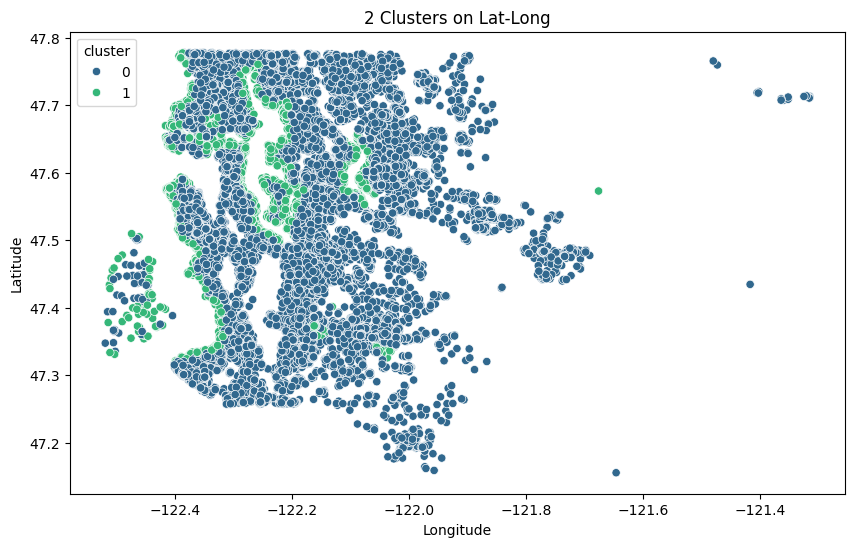

In [96]:
from sklearn.cluster import KMeans
df.drop(columns=['cluster'],inplace=True)

X = df[['lat', 'long', 'is_near_shore']]

# Assuming X is your input data
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X)

# Get the cluster labels for each data point
labels = kmeans.labels_

# Get the cluster centers
centers = kmeans.cluster_centers_

print(f'KMeans Silhouette Score: {kmeans_score}')
kmeans_score = silhouette_score(X, labels)

df['cluster'] = labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster', palette='viridis', data=df)
plt.title(f'{n_clusters} Clusters on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

python(27803) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 980, in _score
    scores = scorer(estimator, X_test, **score_params)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
TypeError: _BaseScorer.__call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
/Users/onur/.pyenv/versions/3.11.2/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:993: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/onur/.pyenv/version

Best DBSCAN params: {'eps': 0.001, 'min_samples': 1}
Best DBSCAN Silhouette Score: 0.26883141543892086


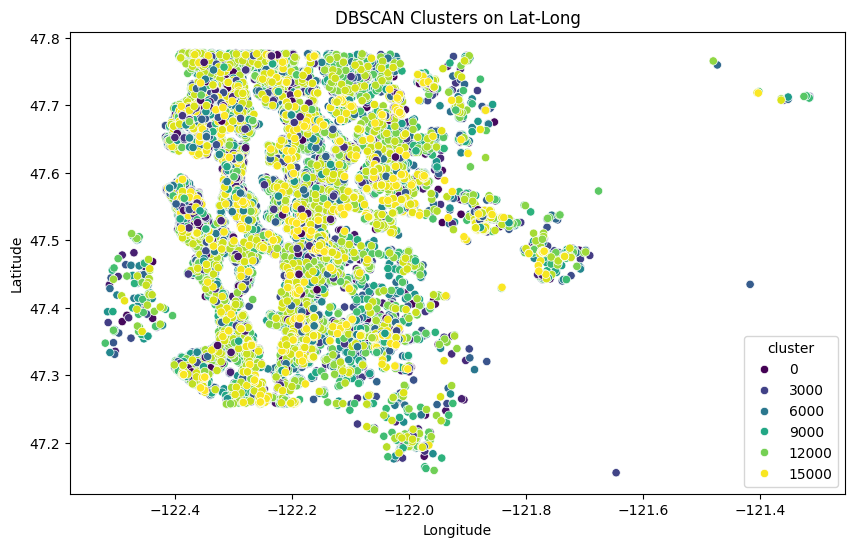

In [102]:
# KMeans clustering
df.drop(columns=['cluster'], inplace=True, errors='ignore')
X = df[['lat', 'long', 'is_near_shore']]


# DBSCAN with grid search
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    if len(set(labels)) > 1:
        return silhouette_score(X, labels)
    else:
        return -1

param_grid = {
    'eps': np.arange(0.001, 0.05, 0.001),
    'min_samples': range(1, 5)
}


dbscan = DBSCAN()
grid_search = GridSearchCV(dbscan, param_grid, scoring=make_scorer(silhouette_scorer),n_jobs=-1, cv=[(slice(None), slice(None))])
grid_search.fit(X)

best_dbscan = grid_search.best_estimator_
best_params = grid_search.best_params_
best_dbscan_labels = best_dbscan.fit_predict(X)
best_dbscan_score = silhouette_score(X, best_dbscan_labels)

print(f'Best DBSCAN params: {best_params}')
print(f'Best DBSCAN Silhouette Score: {best_dbscan_score}')

df['cluster'] = best_dbscan_labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster', palette='viridis', data=df)
plt.title('DBSCAN Clusters on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


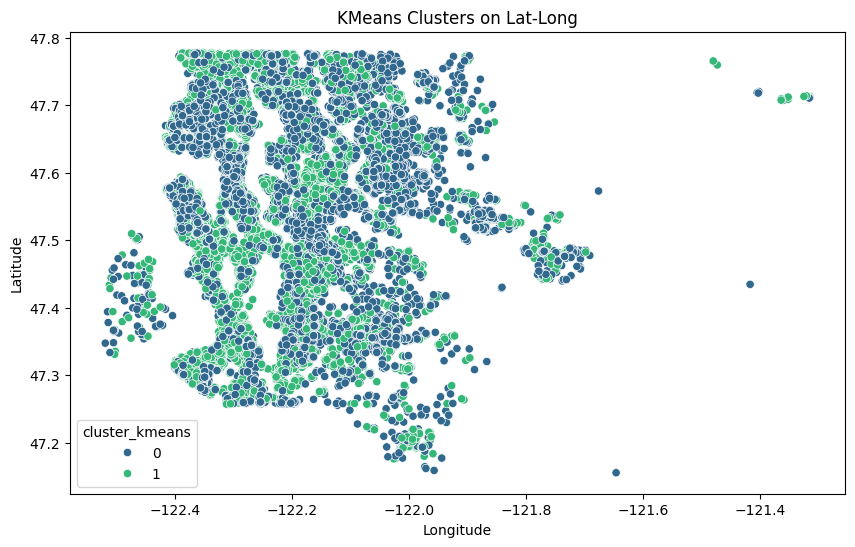

KMeans Cluster Counts:
cluster_kmeans
1    12233
0     9380
Name: count, dtype: int64


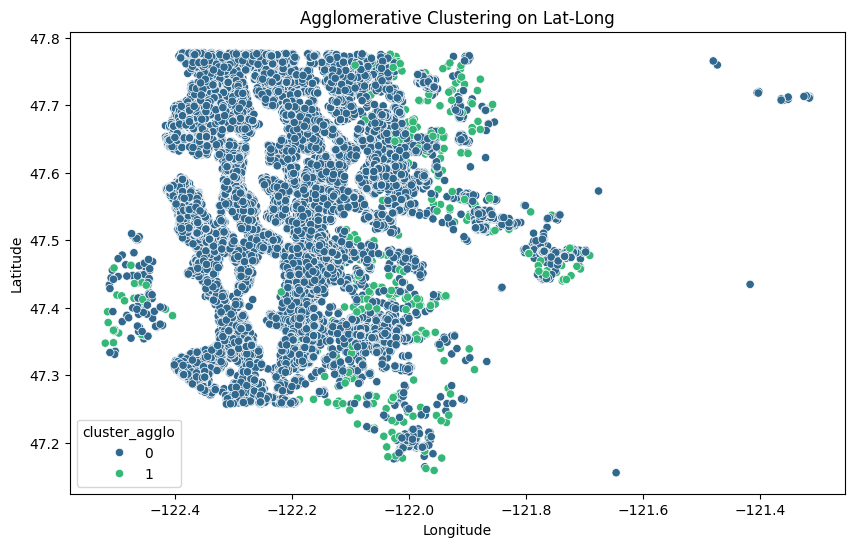

Agglomerative Clustering Cluster Counts:
cluster_agglo
0    21278
1      335
Name: count, dtype: int64
KMeans Silhouette Score: 0.6080610941265815
Agglomerative Clustering Silhouette Score: 0.8808110920395037


In [131]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

cluster_count = 2

# Features for clustering
X = df[['waterfront','floors', 'sqft_lot']]

# Scaling only the 'sqft_lot' feature
scaler = StandardScaler()
X_scaled = X.copy()  # Make a copy of the dataframe to keep the original data intact
#log transform to sqft_lot
X_scaled['sqft_lot'] = np.log1p(X_scaled['sqft_lot'])
#X_scaled['sqft_lot'] = scaler.fit_transform(X[['sqft_lot']])

# KMeans clustering
kmeans = KMeans(n_clusters=cluster_count, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)
kmeans_score = silhouette_score(X_scaled, kmeans_labels)

df['cluster_kmeans'] = kmeans_labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_kmeans', palette='viridis', data=df)
plt.title('KMeans Clusters on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Count samples in each KMeans cluster
kmeans_cluster_counts = df['cluster_kmeans'].value_counts()
print("KMeans Cluster Counts:")
print(kmeans_cluster_counts)

# Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=cluster_count)
agglo_labels = agglo.fit_predict(X_scaled)
agglo_score = silhouette_score(X_scaled, agglo_labels)

df['cluster_agglo'] = agglo_labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_agglo', palette='viridis', data=df)
plt.title('Agglomerative Clustering on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Count samples in each Agglomerative Clustering cluster
agglo_cluster_counts = df['cluster_agglo'].value_counts()
print("Agglomerative Clustering Cluster Counts:")
print(agglo_cluster_counts)

# Summary of Silhouette Scores
print(f'KMeans Silhouette Score: {kmeans_score}')
print(f'Agglomerative Clustering Silhouette Score: {agglo_score}')

In [133]:
dfold = pd.read_csv('../cleaned_data.csv')


In [134]:
dfold

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,quarter,months_since_built,nearest_station_distance_km,bathroom_category,population,density,commute_time
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,4,717,8620.002287,Studio or 1 Bathroom,26282,5364.0,32.9
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,4,767,2078.181042,2-3 Bathrooms,43386,7999.0,28.9
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,1,985,8109.552186,Studio or 1 Bathroom,23556,3833.0,33.1
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,4,599,8918.318639,2-3 Bathrooms,17245,7517.0,30.6
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,1,337,19789.800401,1-2 Bathrooms,30370,2896.0,32.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509,2014,5,2,64,1372.516972,2-3 Bathrooms,52210,11391.0,27.1
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200,2015,2,1,13,8505.181320,2-3 Bathrooms,27879,6034.0,29.8
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007,2014,6,2,65,1942.180508,Studio or 1 Bathroom,31648,9389.0,29.3
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287,2015,1,1,132,18943.445917,2-3 Bathrooms,27808,487.0,29.3


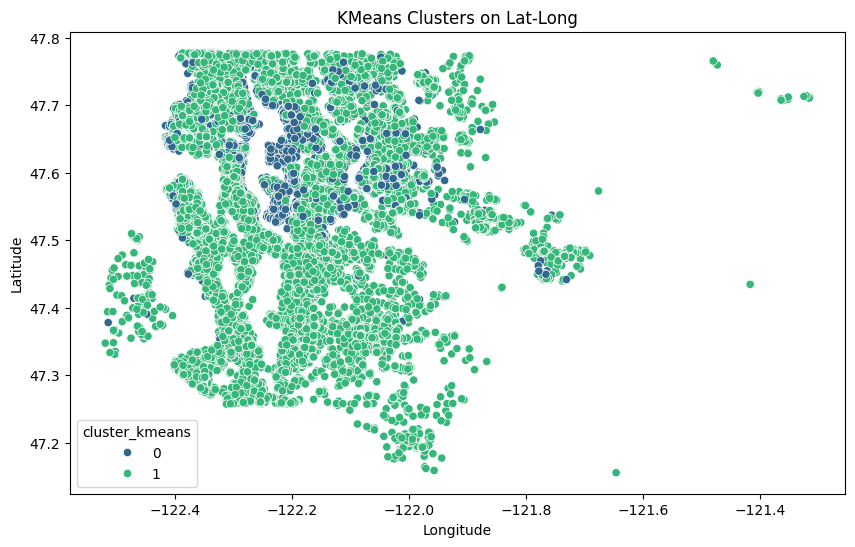

KMeans Cluster Counts:
cluster_kmeans
1    19831
0     1782
Name: count, dtype: int64


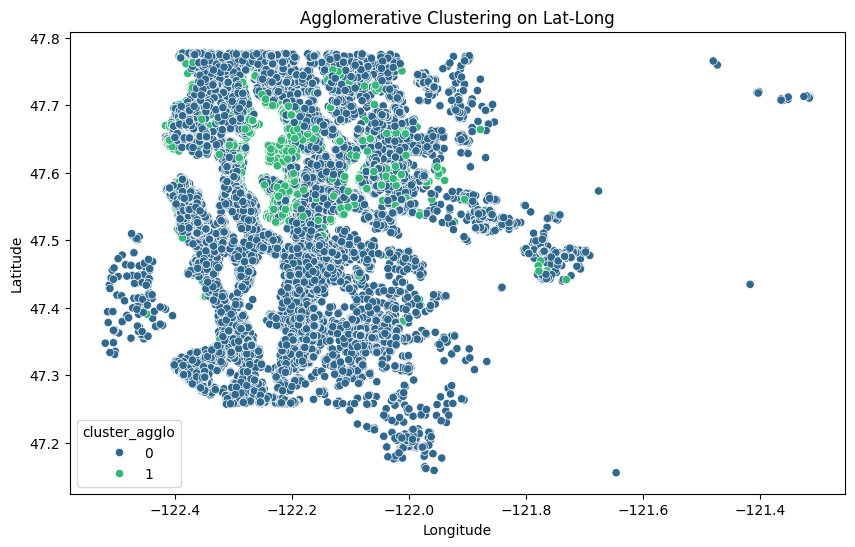

Agglomerative Clustering Cluster Counts:
cluster_agglo
0    20194
1     1419
Name: count, dtype: int64
KMeans Silhouette Score: 0.7325008807276555
Agglomerative Clustering Silhouette Score: 0.7535558817663449


In [245]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer


cluster_count = 2

# Features for clustering
X =  df[['price']]
# get dummies for bathroom_category


# Scaling only the 'sqft_lot' feature
# scaler = StandardScaler()
X_scaled = X.copy()  # Make a copy of the dataframe to keep the original data intact
#X_scaled['sqft_lot'] = np.log1p(X_scaled['sqft_lot'])
#X_scaled['price'] = np.log1p(X_scaled['price'])
#X_scaled['sqft_lot'] = scaler.fit_transform(X[['sqft_lot']])
#X_scaled['price'] = scaler.fit_transform(X[['price']])
# X_scaled['view'] = scaler.fit_transform(X[['view']])
#X_scaled['commute_time'] = scaler.fit_transform(X[['commute_time']])
#X_scaled['lat'] = scaler.fit_transform(X[['lat']])

#X_scaled['distance_to_point_km'] = scaler.fit_transform(X[['distance_to_point_km']])

# KMeans clustering
kmeans = KMeans(n_clusters=cluster_count, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)
kmeans_score = silhouette_score(X_scaled, kmeans_labels)

df['cluster_kmeans'] = kmeans_labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_kmeans', palette='viridis', data=df)
plt.title('KMeans Clusters on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Count samples in each KMeans cluster
kmeans_cluster_counts = df['cluster_kmeans'].value_counts()
print("KMeans Cluster Counts:")
print(kmeans_cluster_counts)

# Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=cluster_count)
agglo_labels = agglo.fit_predict(X_scaled)
agglo_score = silhouette_score(X_scaled, agglo_labels)

df['cluster_agglo'] = agglo_labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_agglo', palette='viridis', data=df)
plt.title('Agglomerative Clustering on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Count samples in each Agglomerative Clustering cluster
agglo_cluster_counts = df['cluster_agglo'].value_counts()
print("Agglomerative Clustering Cluster Counts:")
print(agglo_cluster_counts)

# Summary of Silhouette Scores
print(f'KMeans Silhouette Score: {kmeans_score}')
print(f'Agglomerative Clustering Silhouette Score: {agglo_score}')

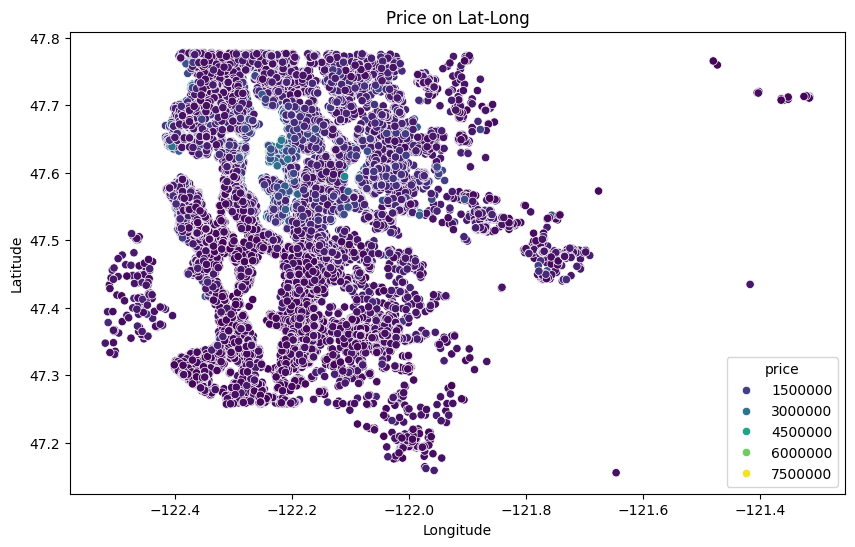

In [241]:
# hue price, graph of lat long
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='price', palette='viridis', data=df)
plt.title('Price on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()

In [227]:
X_scaled

,sqft_lot
0,5650
1,7242
2,10000
3,5000
4,8080
...,...
21608,1131
21609,5813
21610,1350
21611,2388


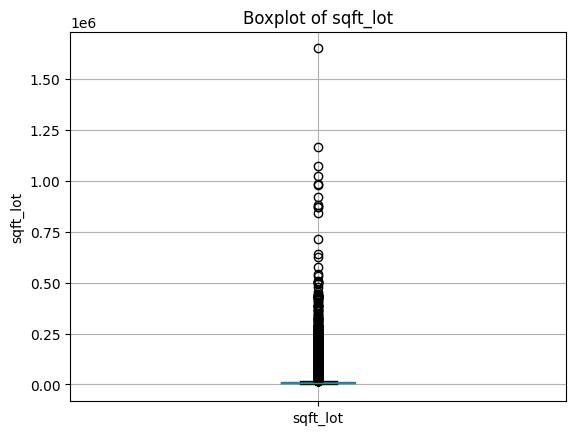

In [190]:
df.boxplot(column='sqft_lot')
plt.ylabel('sqft_lot')
plt.title('Boxplot of sqft_lot')
plt.show()


In [193]:
# sort df by sqft_lot
df.sort_values(by='sqft_lot',ascending=False)

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,cluster,cluster_kmeans,cluster_dbscan,cluster_agglo
1719,700000.0,4,1.00,1651359,1.0,0,3,4,1920,0,98022,47.2313,-122.023,44405.990573,Studio or 1 Bathroom,30.0,34.4,10.159342,False,7800,1644,2,1699,0
17319,190000.0,2,1.00,1164794,1.0,0,0,2,1915,0,98014,47.6888,-121.909,29960.571858,Studio or 1 Bathroom,89.0,34.2,13.702344,False,3550,12915,2,16452,0
7647,542500.0,5,3.25,1074218,1.5,0,0,5,1931,0,98027,47.4564,-122.004,26911.475355,+3 Bathrooms,487.0,29.3,8.892869,False,24080,6527,2,7447,0
7769,855000.0,4,3.50,1024068,2.0,0,0,3,2006,0,98045,47.4619,-121.744,44713.847242,+3 Bathrooms,91.0,30.2,5.389363,False,40300,5122,2,7566,0
3949,998000.0,4,3.25,982998,2.0,0,0,3,1992,0,98058,47.4140,-122.087,24992.558318,+3 Bathrooms,2252.0,34.9,1.694812,False,37700,3608,2,3886,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20604,256950.0,2,2.00,635,2.0,0,0,3,2008,0,98106,47.5212,-122.357,7294.076213,1-2 Bathrooms,5006.0,29.4,3.218065,False,9630,246,0,542,1
3452,1234570.0,2,2.50,609,3.0,0,0,3,2011,0,98112,47.6182,-122.312,625.205165,2-3 Bathrooms,7621.0,25.4,1.887991,False,27170,3187,0,3399,1
7589,367500.0,2,2.00,600,2.0,0,0,3,2004,0,98116,47.5788,-122.410,6363.498013,1-2 Bathrooms,9060.0,32.7,0.090259,True,8240,6486,0,7392,1
5826,250000.0,3,2.25,572,2.0,0,0,3,2006,0,98106,47.5549,-122.363,4705.152339,2-3 Bathrooms,5006.0,29.4,3.186043,False,7350,5113,0,5701,1


In [195]:
#find outliers based on sqft_lot
q1 = df['sqft_lot'].quantile(0.25)
q3 = df['sqft_lot'].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr
outliers = df[(df['sqft_lot'] < lower_bound) | (df['sqft_lot'] > upper_bound)]
outliers.sort_values(by='sqft_lot',ascending=False)

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,cluster,cluster_kmeans,cluster_dbscan,cluster_agglo
1719,700000.0,4,1.00,1651359,1.0,0,3,4,1920,0,98022,47.2313,-122.023,44405.990573,Studio or 1 Bathroom,30.0,34.4,10.159342,False,7800,1644,2,1699,0
17319,190000.0,2,1.00,1164794,1.0,0,0,2,1915,0,98014,47.6888,-121.909,29960.571858,Studio or 1 Bathroom,89.0,34.2,13.702344,False,3550,12915,2,16452,0
7647,542500.0,5,3.25,1074218,1.5,0,0,5,1931,0,98027,47.4564,-122.004,26911.475355,+3 Bathrooms,487.0,29.3,8.892869,False,24080,6527,2,7447,0
7769,855000.0,4,3.50,1024068,2.0,0,0,3,2006,0,98045,47.4619,-121.744,44713.847242,+3 Bathrooms,91.0,30.2,5.389363,False,40300,5122,2,7566,0
3949,998000.0,4,3.25,982998,2.0,0,0,3,1992,0,98058,47.4140,-122.087,24992.558318,+3 Bathrooms,2252.0,34.9,1.694812,False,37700,3608,2,3886,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6418,795000.0,4,2.50,19193,1.0,0,3,4,1973,0,98075,47.5755,-122.070,18200.724150,2-3 Bathrooms,2675.0,32.3,0.186607,True,25840,5568,1,6270,2
16184,1300000.0,5,1.75,19180,1.0,0,0,3,1968,0,98004,47.6380,-122.213,6944.768112,1-2 Bathrooms,5315.0,21.7,0.820030,False,17040,12247,0,15415,1
18797,244950.0,4,2.50,19177,1.0,0,0,4,1966,0,98030,47.3617,-122.172,26385.692446,2-3 Bathrooms,5499.0,30.7,1.079172,False,12530,13772,0,17777,1
18756,999000.0,4,2.75,19168,2.0,0,0,3,1992,0,98075,47.5911,-122.037,20717.461114,2-3 Bathrooms,2675.0,32.3,3.045404,False,28000,13747,0,17738,1


In [199]:
# find outliers based on z score for sqft_lot
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(df['sqft_lot']))
threshold = 3
outliers = df[(z > 3)]
outliers.sort_values(by='sqft_lot',ascending=False)


,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,cluster,cluster_kmeans,cluster_dbscan,cluster_agglo
1719,700000.0,4,1.00,1651359,1.0,0,3,4,1920,0,98022,47.2313,-122.023,44405.990573,Studio or 1 Bathroom,30.0,34.4,10.159342,False,7800,1644,2,1699,0
17319,190000.0,2,1.00,1164794,1.0,0,0,2,1915,0,98014,47.6888,-121.909,29960.571858,Studio or 1 Bathroom,89.0,34.2,13.702344,False,3550,12915,2,16452,0
7647,542500.0,5,3.25,1074218,1.5,0,0,5,1931,0,98027,47.4564,-122.004,26911.475355,+3 Bathrooms,487.0,29.3,8.892869,False,24080,6527,2,7447,0
7769,855000.0,4,3.50,1024068,2.0,0,0,3,2006,0,98045,47.4619,-121.744,44713.847242,+3 Bathrooms,91.0,30.2,5.389363,False,40300,5122,2,7566,0
3949,998000.0,4,3.25,982998,2.0,0,0,3,1992,0,98058,47.4140,-122.087,24992.558318,+3 Bathrooms,2252.0,34.9,1.694812,False,37700,3608,2,3886,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1644,299000.0,3,1.00,142803,1.0,0,0,3,1974,0,98001,47.3192,-122.287,28973.331986,Studio or 1 Bathroom,1895.0,31.6,4.324622,False,10570,1575,0,1624,1
10951,1610000.0,5,4.50,142725,3.0,0,0,3,2000,0,98014,47.6085,-121.952,26833.694713,+3 Bathrooms,89.0,34.2,9.115732,False,66935,8897,0,10552,1
9402,1090000.0,4,2.50,141570,2.5,0,0,3,1992,0,98053,47.6805,-122.048,19508.389047,2-3 Bathrooms,827.0,32.5,4.843532,False,47740,4562,0,9081,1
15579,565000.0,4,2.75,139392,2.0,0,0,4,1981,0,98030,47.3535,-122.190,26727.847658,2-3 Bathrooms,5499.0,30.7,2.687560,False,28170,11870,0,14866,1


In [208]:
#grade living mean differene between outliers and non outliers
print(outliers['grade_living'].mean())
# remove outliers from df than find mean of grade living
#marking outliers as boolean in df
df['outliers'] = z > 3

16603.9661901627


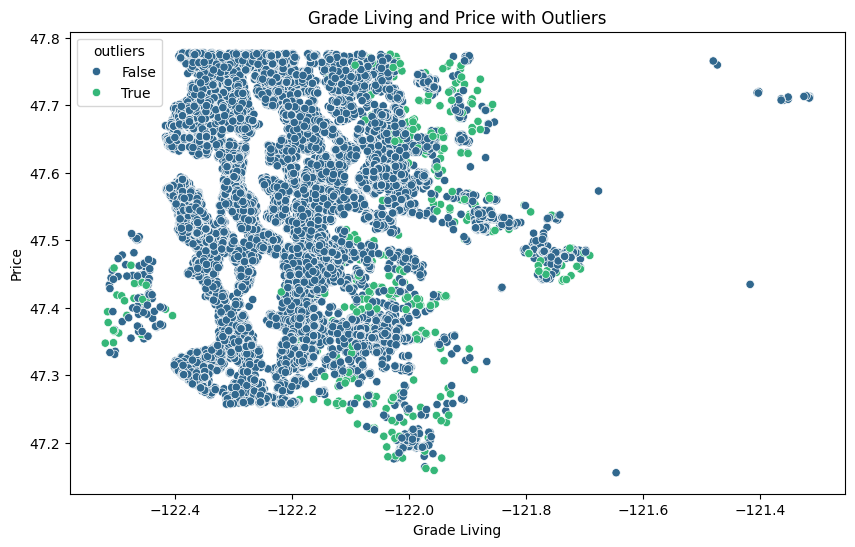

In [211]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming `outliers` is a pandas Series or DataFrame containing boolean values indicating outliers
# Example:
# outliers = df['is_outlier']  # Adjust this according to your outlier detection method

plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='outliers', palette='viridis', data=df)
plt.title('Grade Living and Price with Outliers')
plt.xlabel('Grade Living')
plt.ylabel('Price')
plt.show()


In [229]:
outliers_price_stats = df[df['cluster_kmeans'] == 0]['sqft_lot'].describe()
outliers_price_stats.apply(lambda x: '{:.0f}'.format(x))

count     21269
mean      10939
std       13834
min         520
25%        5005
50%        7552
75%       10404
max      141570
Name: sqft_lot, dtype: object

In [223]:
outliers_price_stats = df[df['outliers'] == 0]['sqft_lot'].describe()
outliers_price_stats.apply(lambda x: '{:.0f}'.format(x))

count     21266
mean      10921
std       13750
min         520
25%        5005
50%        7552
75%       10403
max      138085
Name: sqft_lot, dtype: object

/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_12529/637987006.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonout['cluster_kmeans'] = kmeans_labels


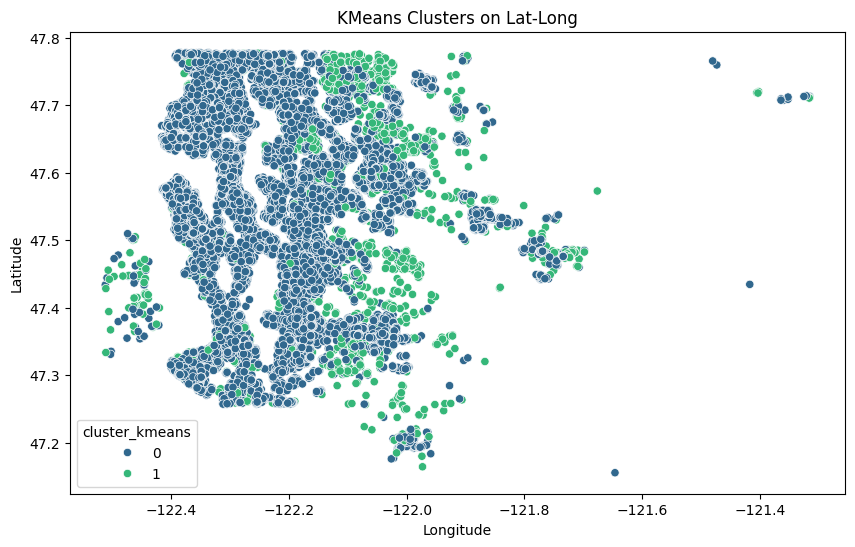

KMeans Cluster Counts:
cluster_kmeans
1    19831
0     1782
Name: count, dtype: int64


/var/folders/m7/snhszr993kscmjx9dwlff1lm0000gn/T/ipykernel_12529/637987006.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonout['cluster_agglo'] = agglo_labels


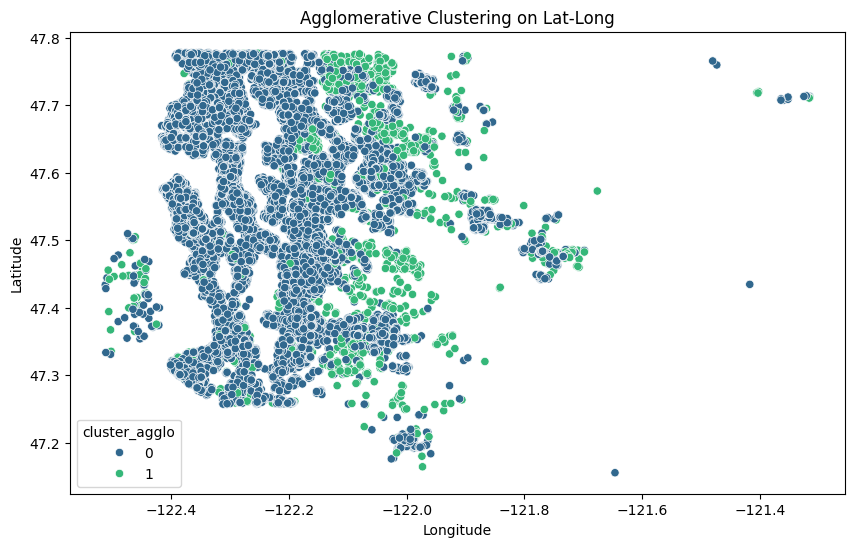

Agglomerative Clustering Cluster Counts:
cluster_agglo
0    20194
1     1419
Name: count, dtype: int64
KMeans Silhouette Score: 0.7800539056735744
Agglomerative Clustering Silhouette Score: 0.771262378788772


In [252]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer


cluster_count = 2
nonout = df[df['outliers'] == 0]
# Features for clustering
X =  nonout[['sqft_lot','view']]
# get dummies for bathroom_category


# Scaling only the 'sqft_lot' feature
# scaler = StandardScaler()
X_scaled = X.copy()  # Make a copy of the dataframe to keep the original data intact
X_scaled['sqft_lot'] = np.log1p(X_scaled['sqft_lot'])
#X_scaled['price'] = np.log1p(X_scaled['price'])
X_scaled['sqft_lot'] = scaler.fit_transform(X[['sqft_lot']])
#X_scaled['price'] = scaler.fit_transform(X[['price']])
# X_scaled['view'] = scaler.fit_transform(X[['view']])
#X_scaled['commute_time'] = scaler.fit_transform(X[['commute_time']])
#X_scaled['lat'] = scaler.fit_transform(X[['lat']])

#X_scaled['distance_to_point_km'] = scaler.fit_transform(X[['distance_to_point_km']])

# KMeans clustering
kmeans = KMeans(n_clusters=cluster_count, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)
kmeans_score = silhouette_score(X_scaled, kmeans_labels)

nonout['cluster_kmeans'] = kmeans_labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_kmeans', palette='viridis', data=nonout)
plt.title('KMeans Clusters on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Count samples in each KMeans cluster
kmeans_cluster_counts = df['cluster_kmeans'].value_counts()
print("KMeans Cluster Counts:")
print(kmeans_cluster_counts)

# Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=cluster_count)
agglo_labels = agglo.fit_predict(X_scaled)
agglo_score = silhouette_score(X_scaled, agglo_labels)

nonout['cluster_agglo'] = agglo_labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_agglo', palette='viridis', data=nonout)
plt.title('Agglomerative Clustering on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Count samples in each Agglomerative Clustering cluster
agglo_cluster_counts = df['cluster_agglo'].value_counts()
print("Agglomerative Clustering Cluster Counts:")
print(agglo_cluster_counts)

# Summary of Silhouette Scores
print(f'KMeans Silhouette Score: {kmeans_score}')
print(f'Agglomerative Clustering Silhouette Score: {agglo_score}')

In [278]:
df6 = pd.read_csv('../cleaned_data_v2.csv')
df6.drop(columns=['bathrooms'],inplace=True)
df6

,price,bedrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,221900.0,3,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260
1,538000.0,3,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990
2,180000.0,2,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620
3,604000.0,4,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720
4,510000.0,3,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,1131,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,2-3 Bathrooms,11391.0,27.1,1.708484,False,12240
21609,400000.0,4,5813,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,2-3 Bathrooms,6034.0,29.8,1.990125,False,18480
21610,402101.0,2,1350,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,Studio or 1 Bathroom,9389.0,29.3,0.886906,False,7140
21611,400000.0,3,2388,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,2-3 Bathrooms,487.0,29.3,2.354171,False,12800


In [282]:
from pyod.models.ecod import ECOD
from sklearn.model_selection import train_test_split
from pyod.utils.data import evaluate_print
from pyod.utils.example import visualize
# https://github.com/yzhao062/pyod


#df6 = pd.get_dummies(df6, columns=['view','condition','bathroom_category'])
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df6)

X = data_scaled.drop(columns=['price'])
y = data_scaled['price']



# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # train ECOD detector
clf_name = 'ECOD'
clf = ECOD()

    # you could try parallel version as well.
    # clf = ECOD(n_jobs=2)
clf.fit(X_train)

    # get the prediction labels and outlier scores of the training data
y_train_pred = clf.labels_  # binary labels (0: inliers, 1: outliers)
y_train_scores = clf.decision_scores_  # raw outlier scores

    # get the prediction on the test data
y_test_pred = clf.predict(X_test)  # outlier labels (0 or 1)
df6["outliers"] = clf.predict(scaler.transform(df6.drop(columns=['price'])))
#y_test_scores = clf.decision_function(X_test)  # outlier scores

    # evaluate and print the results
print("\nOn Training Data:")
#evaluate_print(clf_name, y_train, y_train_scores)
print("\nOn Test Data:")
#evaluate_print(clf_name, y_test, y_test_scores)

    # visualize the results
#visualize(clf_name, X_train, y_train, X_test, y_test, y_train_pred,
#              y_test_pred, show_figure=True, save_figure=False)

AttributeError: 'numpy.ndarray' object has no attribute 'drop'

In [269]:
data

,price,bedrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bathroom_category_+3 Bathrooms,bathroom_category_1-2 Bathrooms,bathroom_category_2-3 Bathrooms,bathroom_category_Studio or 1 Bathroom
0,221900.0,3,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,5364.0,32.9,0.595763,False,8260,False,False,False,True
1,538000.0,3,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,7999.0,28.9,3.038596,False,17990,False,False,True,False
2,180000.0,2,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,3833.0,33.1,2.317669,False,4620,False,False,False,True
3,604000.0,4,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,7517.0,30.6,0.101668,True,13720,False,False,True,False
4,510000.0,3,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,2896.0,32.7,1.750656,False,13440,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,1131,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,11391.0,27.1,1.708484,False,12240,False,False,True,False
21609,400000.0,4,5813,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,6034.0,29.8,1.990125,False,18480,False,False,True,False
21610,402101.0,2,1350,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,9389.0,29.3,0.886906,False,7140,False,False,False,True
21611,400000.0,3,2388,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,487.0,29.3,2.354171,False,12800,False,False,True,False


In [270]:
# change true false columns to 0 and 1
data['bathroom_category_+3 Bathrooms'] = data['bathroom_category_+3 Bathrooms'].astype(int)
data['bathroom_category_1-2 Bathrooms'] = data['bathroom_category_1-2 Bathrooms'].astype(int)
data['bathroom_category_1-2 Bathrooms'] = data['bathroom_category_1-2 Bathrooms'].astype(int)
data['bathroom_category_Studio or 1 Bathroom'] = data['bathroom_category_Studio or 1 Bathroom'].astype(int)
data['is_near_shore'] = data['is_near_shore'].astype(int)

In [272]:
data['bathroom_category_2-3 Bathrooms'] = data['bathroom_category_2-3 Bathrooms'].astype(int)

In [273]:
data

,price,bedrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,density,commute_time,distance_to_point_km,is_near_shore,grade_living,bathroom_category_+3 Bathrooms,bathroom_category_1-2 Bathrooms,bathroom_category_2-3 Bathrooms,bathroom_category_Studio or 1 Bathroom
0,221900.0,3,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,5364.0,32.9,0.595763,0,8260,0,0,0,1
1,538000.0,3,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,7999.0,28.9,3.038596,0,17990,0,0,1,0
2,180000.0,2,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,3833.0,33.1,2.317669,0,4620,0,0,0,1
3,604000.0,4,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,7517.0,30.6,0.101668,1,13720,0,0,1,0
4,510000.0,3,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,2896.0,32.7,1.750656,0,13440,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,1131,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,11391.0,27.1,1.708484,0,12240,0,0,1,0
21609,400000.0,4,5813,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,6034.0,29.8,1.990125,0,18480,0,0,1,0
21610,402101.0,2,1350,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,9389.0,29.3,0.886906,0,7140,0,0,0,1
21611,400000.0,3,2388,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,487.0,29.3,2.354171,0,12800,0,0,1,0


In [3]:
import pandas as pd

In [65]:
df = pd.read_csv('../cleaned_data_v2.csv')

In [66]:
df

,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,zipcode,lat,long,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living
0,221900.0,3,1.00,5650,1.0,0,0,3,1955,0,98178,47.5112,-122.257,8620.002287,Studio or 1 Bathroom,5364.0,32.9,0.595763,False,8260
1,538000.0,3,2.25,7242,2.0,0,0,3,1951,1991,98125,47.7210,-122.319,2078.181042,2-3 Bathrooms,7999.0,28.9,3.038596,False,17990
2,180000.0,2,1.00,10000,1.0,0,0,3,1933,0,98028,47.7379,-122.233,8109.552186,Studio or 1 Bathroom,3833.0,33.1,2.317669,False,4620
3,604000.0,4,3.00,5000,1.0,0,0,5,1965,0,98136,47.5208,-122.393,8918.318639,2-3 Bathrooms,7517.0,30.6,0.101668,True,13720
4,510000.0,3,2.00,8080,1.0,0,0,3,1987,0,98074,47.6168,-122.045,19789.800401,1-2 Bathrooms,2896.0,32.7,1.750656,False,13440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1131,3.0,0,0,3,2009,0,98103,47.6993,-122.346,1372.516972,2-3 Bathrooms,11391.0,27.1,1.708484,False,12240
21609,400000.0,4,2.50,5813,2.0,0,0,3,2014,0,98146,47.5107,-122.362,8505.181320,2-3 Bathrooms,6034.0,29.8,1.990125,False,18480
21610,402101.0,2,0.75,1350,2.0,0,0,3,2009,0,98144,47.5944,-122.299,1942.180508,Studio or 1 Bathroom,9389.0,29.3,0.886906,False,7140
21611,400000.0,3,2.50,2388,2.0,0,0,3,2004,0,98027,47.5345,-122.069,18943.445917,2-3 Bathrooms,487.0,29.3,2.354171,False,12800


In [16]:
# remove outliers from price based on z score
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(df['price']))
threshold = 3
outliers = df[(z > 3)]
outliers.sort_values(by='price',ascending=False)


,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,yr_built,yr_renovated,...,nearest_station_distance_km,bathroom_category,density,commute_time,distance_to_point_km,is_near_shore,grade_living,cluster_kmeans_2,cluster_kmeans_3,cluster_kmeans_4
7252,7700000.0,6,8.00,27600,2.5,0,3,4,1910,1987,...,1128.610823,+3 Bathrooms,19956.0,26.2,0.392496,True,156650,0,2,3
3914,7062500.0,5,4.50,37325,2.0,1,2,3,1940,2001,...,6742.718139,+3 Bathrooms,5315.0,21.7,0.065713,True,110440,0,2,3
9254,6885000.0,6,7.75,31374,2.0,0,4,3,2001,0,...,5250.655875,+3 Bathrooms,2040.0,21.2,0.143008,True,128570,0,2,3
4411,5570000.0,5,5.75,35069,2.0,0,0,3,2001,0,...,5804.005191,+3 Bathrooms,2040.0,21.2,0.889411,False,119600,0,2,3
1448,5350000.0,5,5.00,23985,2.0,0,4,3,2009,0,...,6954.961581,+3 Bathrooms,5315.0,21.7,0.864419,False,96000,0,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10958,1650000.0,8,2.75,20666,1.0,0,0,4,1962,0,...,6462.709385,2-3 Bathrooms,5315.0,21.7,0.739917,False,36360,1,2,3
2565,1650000.0,4,3.00,9750,1.0,0,4,5,1972,0,...,11763.365791,2-3 Bathrooms,3524.0,27.6,2.356093,False,39000,0,2,3
2179,1650000.0,3,2.75,8890,2.0,1,4,4,1975,1991,...,9287.132840,2-3 Bathrooms,3524.0,27.6,0.001229,True,26900,1,2,2
9737,1648000.0,4,3.50,12500,2.0,0,2,3,2003,0,...,7569.791167,+3 Bathrooms,4318.0,24.4,0.118983,True,50710,0,2,3


In [43]:
df['grade_living_bins'] = pd.qcut(df['grade_living'], q=5)
df['grade_living_bins']

0         (289.999, 9240.0]
1        (16240.0, 22720.0]
2         (289.999, 9240.0]
3        (12390.0, 16240.0]
4        (12390.0, 16240.0]
                ...        
21608     (9240.0, 12390.0]
21609    (16240.0, 22720.0]
21610     (289.999, 9240.0]
21611    (12390.0, 16240.0]
21612     (289.999, 9240.0]
Name: grade_living_bins, Length: 21613, dtype: category
Categories (5, interval[float64, right]): [(289.999, 9240.0] < (9240.0, 12390.0] < (12390.0, 16240.0] < (16240.0, 22720.0] < (22720.0, 162480.0]]

In [42]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

df['grade_living_bins'] = pd.qcut(df['grade_living'], q=5)

#z = np.abs(stats.zscore(df['price']))
#df_d = df[(z < 3)]
# Features for clustering
X = df[['lat','long','grade_living_bins']]
# # one hot encode zipcode
encoded_df = pd.get_dummies(X, columns=['grade_living_bins'])


#scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(encoded_df)


# Perform K-means clustering for 2 clusters
kmeans_2 = KMeans(n_clusters=2, random_state=42)
kmeans_labels_2 = kmeans_2.fit_predict(X)

# Perform K-means clustering for 3 clusters
kmeans_3 = KMeans(n_clusters=3, random_state=42)
kmeans_labels_3 = kmeans_3.fit_predict(X)

# Perform K-means clustering for 4 clusters
kmeans_4 = KMeans(n_clusters=4, random_state=42)
kmeans_labels_4 = kmeans_4.fit_predict(X)

# Add cluster labels to the dataframe
df['cluster_kmeans_2'] = kmeans_labels_2
df['cluster_kmeans_3'] = kmeans_labels_3
df['cluster_kmeans_4'] = kmeans_labels_4


# Calculate silhouette score for 2 clusters
silhouette_score_2 = silhouette_score(X, kmeans_labels_2)
cluster_count_2 = len(set(kmeans_labels_2))

# Calculate silhouette score for 3 clusters
silhouette_score_3 = silhouette_score(X, kmeans_labels_3)
cluster_count_3 = len(set(kmeans_labels_3))

# Calculate silhouette score for 4 clusters
silhouette_score_4 = silhouette_score(X, kmeans_labels_4)
cluster_count_4 = len(set(kmeans_labels_4))

# Print the results
print("Silhouette Score and Cluster Count for 2 Clusters:")
print("Silhouette Score:", silhouette_score_2)
print("Cluster Count:", cluster_count_2)

print("Silhouette Score and Cluster Count for 3 Clusters:")
print("Silhouette Score:", silhouette_score_3)
print("Cluster Count:", cluster_count_3)

print("Silhouette Score and Cluster Count for 4 Clusters:")
print("Silhouette Score:", silhouette_score_4)
print("Cluster Count:", cluster_count_4)


TypeError: float() argument must be a string or a real number, not 'pandas._libs.interval.Interval'

In [37]:
df['cluster_kmeans_2'].value_counts()

cluster_kmeans_2
0    17281
1     4332
Name: count, dtype: int64

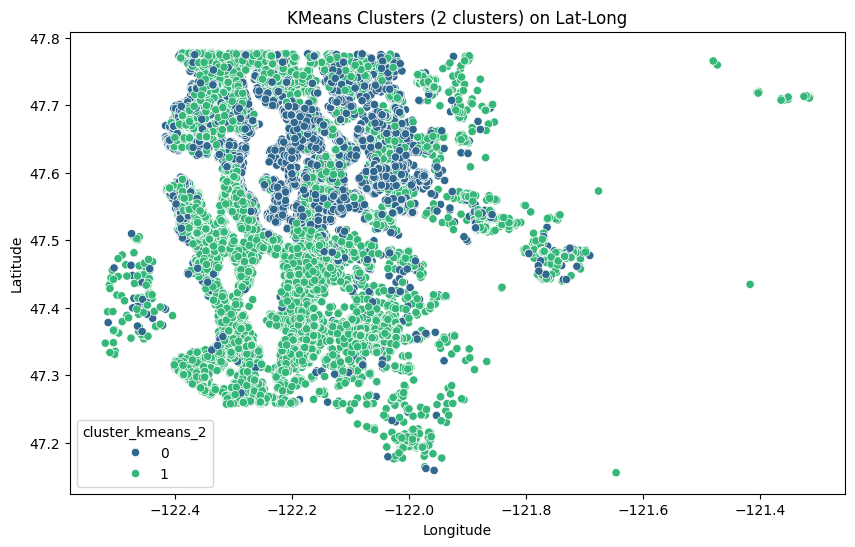

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_kmeans_2', palette='viridis', data=df_d)
plt.title('KMeans Clusters (2 clusters) on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


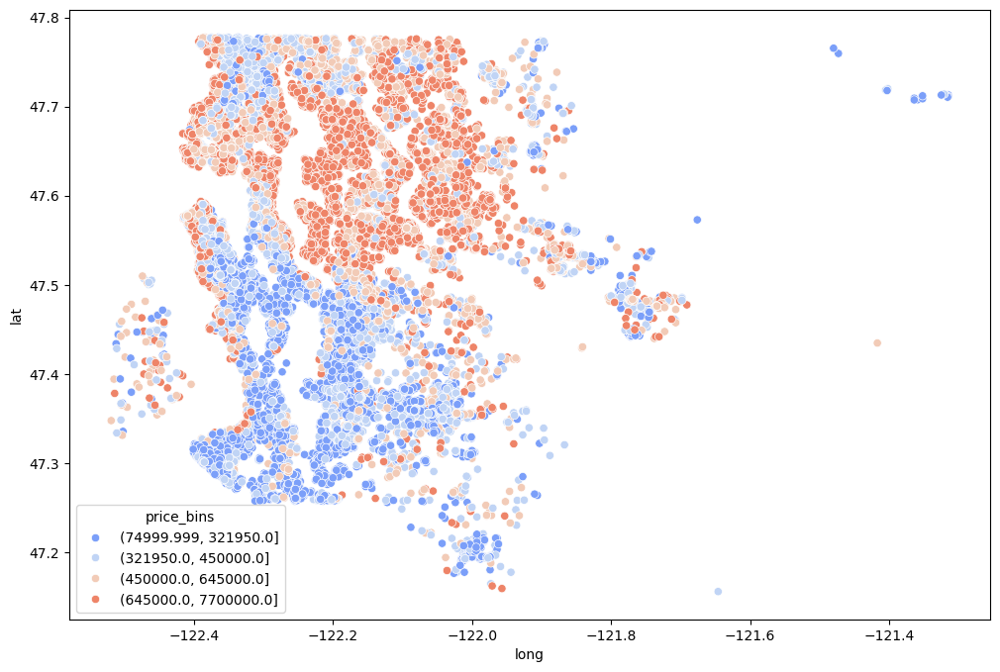

In [104]:
# Create price bins 
df['price_bins'] = pd.qcut(df['price'], q=4)  # Divide the price by 5 according to counts

# Crate scatter plot
plt.figure(figsize=(12, 8))
sns.scatterplot(x='long', y='lat', data=df, hue='price_bins', palette='coolwarm')
plt.show()

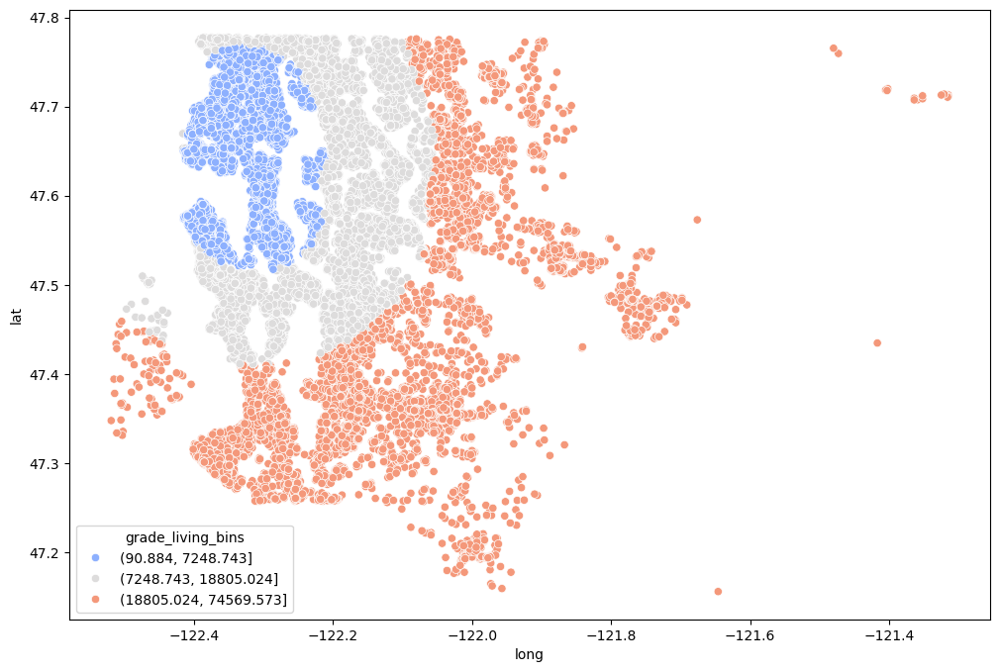

In [64]:
# Create price bins 
df['grade_living_bins'] = pd.qcut(df['nearest_station_distance_km'], q=3)  # Divide the price by 5 according to counts

# Crate scatter plot
plt.figure(figsize=(12, 8))
sns.scatterplot(x='long', y='lat', data=df, hue='grade_living_bins', palette='coolwarm')
plt.show()

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv('../cleaned_data_v2.csv')

In [56]:
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_lot', 'floors', 'waterfront',
       'view', 'condition', 'yr_built', 'yr_renovated', 'zipcode', 'lat',
       'long', 'nearest_station_distance_km', 'bathroom_category', 'density',
       'commute_time', 'distance_to_point_km', 'is_near_shore',
       'grade_living'],
      dtype='object')

In [55]:
df = pd.read_csv('../cleaned_data_v2.csv')

In [85]:
# create a new column for price bins based on the price
df['grade_bins'] = pd.qcut(df['grade_living'], q=3)
df['lot_bins'] = pd.qcut(df['sqft_lot'], q=10)

from sklearn.preprocessing import StandardScaler 

# k means clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Features for clustering
X = df[['lat','grade_bins','bathroom_category']]

# encode price bins
encoded_df = pd.get_dummies(X, columns=['bathroom_category','grade_bins'])

# Scale the data
scaler = StandardScaler()
#X_scaled = encoded_df
X_scaled = scaler.fit_transform(encoded_df)

# Perform K-means clustering for 2 clusters
kmeans_2 = KMeans(n_clusters=2, random_state=42)
kmeans_labels_2 = kmeans_2.fit_predict(X_scaled)

# Perform K-means clustering for 3 clusters
kmeans_3 = KMeans(n_clusters=3, random_state=42)
kmeans_labels_3 = kmeans_3.fit_predict(X_scaled)

# Perform K-means clustering for 4 clusters
kmeans_4 = KMeans(n_clusters=4, random_state=42)
kmeans_labels_4 = kmeans_4.fit_predict(X_scaled)

# Add cluster labels to the dataframe
df['cluster_kmeans_2'] = kmeans_labels_2
df['cluster_kmeans_3'] = kmeans_labels_3
df['cluster_kmeans_4'] = kmeans_labels_4

# Calculate silhouette score for 2 clusters
silhouette_score_2 = silhouette_score(X_scaled, kmeans_labels_2)
cluster_count_2 = len(set(kmeans_labels_2))

# Calculate silhouette score for 3 clusters
silhouette_score_3 = silhouette_score(X_scaled, kmeans_labels_3)
cluster_count_3 = len(set(kmeans_labels_3))

# Calculate silhouette score for 4 clusters
silhouette_score_4 = silhouette_score(X_scaled, kmeans_labels_4)
cluster_count_4 = len(set(kmeans_labels_4))

# Print the results
print("Silhouette Score and Cluster Count for 2 Clusters:")
print("Silhouette Score:", silhouette_score_2)
print("Cluster Count:", cluster_count_2)

# Print the results
print("Silhouette Score and Cluster Count for 3 Clusters:")
print("Silhouette Score:", silhouette_score_3)
print("Cluster Count:", cluster_count_3)

# Print the results
print("Silhouette Score and Cluster Count for 4 Clusters:")
print("Silhouette Score:", silhouette_score_4)
print("Cluster Count:", cluster_count_4)





Silhouette Score and Cluster Count for 2 Clusters:
Silhouette Score: 0.3059994633361944
Cluster Count: 2
Silhouette Score and Cluster Count for 3 Clusters:
Silhouette Score: 0.3765980147838099
Cluster Count: 3
Silhouette Score and Cluster Count for 4 Clusters:
Silhouette Score: 0.45961916847162
Cluster Count: 4


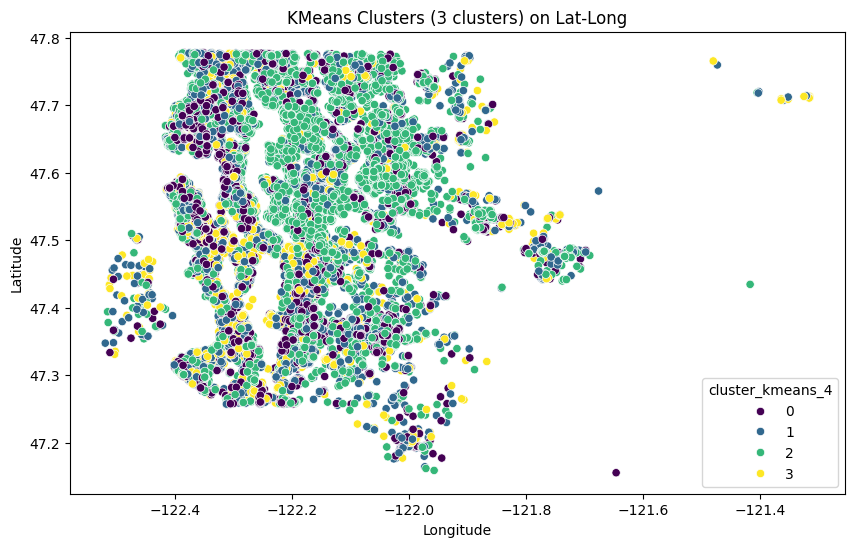

In [81]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_kmeans_4', palette='viridis', data=df)
plt.title('KMeans Clusters (3 clusters) on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [82]:
df['cluster_kmeans_4'].value_counts()

cluster_kmeans_4
2    6542
1    6423
0    4710
3    3938
Name: count, dtype: int64

In [83]:
df['lot_bins'].value_counts()

lot_bins
(8520.2, 9800.0]        2177
(4644.0, 5612.0]        2164
(519.999, 3322.2]       2162
(3322.2, 4644.0]        2162
(21397.6, 1651359.0]    2162
(6744.0, 7618.0]        2161
(7618.0, 8520.2]        2161
(12186.6, 21397.6]      2161
(5612.0, 6744.0]        2158
(9800.0, 12186.6]       2145
Name: count, dtype: int64

DBSCAN Silhouette Score: 0.8372957063262577


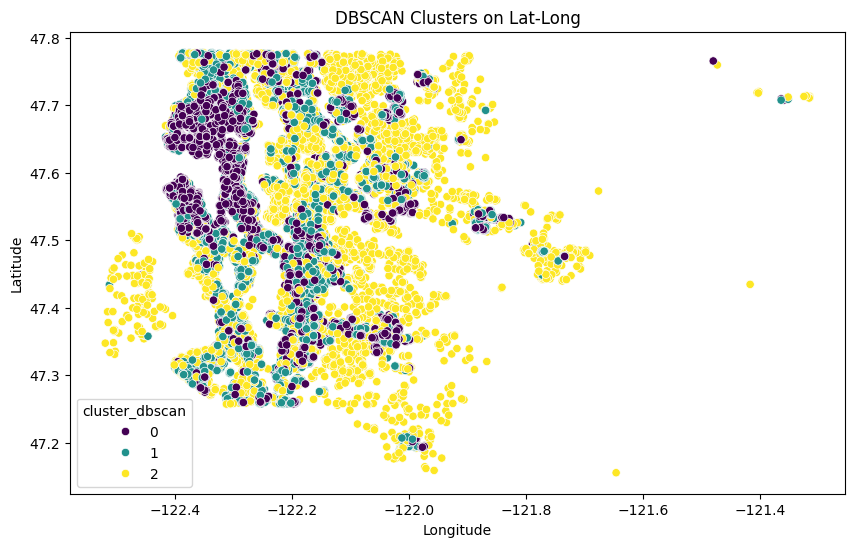

In [99]:
# dbscan for f[['lat','long','lot_bins']]
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Features for clustering
X = df[['lat','long','lot_bins']]
# encode price bins
encoded_df = pd.get_dummies(X, columns=['lot_bins'])

# Scale the data
scaler = StandardScaler()
X_scaled = encoded_df
#X_scaled = scaler.fit_transform(encoded_df)

# DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=2)
dbscan_labels = dbscan.fit_predict(X_scaled)
dbscan_score = silhouette_score(X_scaled, dbscan_labels)

# Add cluster labels to the dataframe
df['cluster_dbscan'] = dbscan_labels

# Print the results
print("DBSCAN Silhouette Score:", dbscan_score)

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_dbscan', palette='viridis', data=df)
plt.title('DBSCAN Clusters on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [101]:
df['cluster_dbscan'].value_counts()

cluster_dbscan
0    7358
2    7194
1    7061
Name: count, dtype: int64

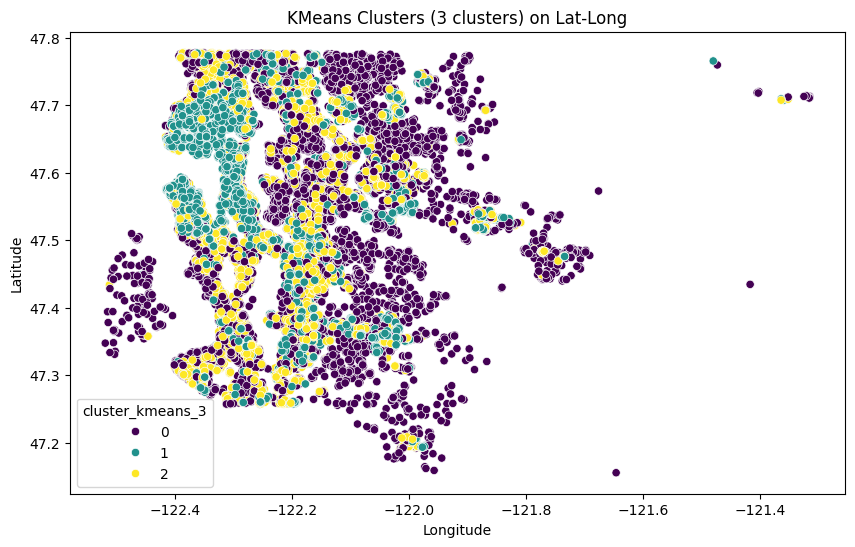

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# show cluster 3 colors on lat long
plt.figure(figsize=(10, 6))
sns.scatterplot(x='long', y='lat', hue='cluster_kmeans_3', palette='viridis', data=df)
plt.title('KMeans Clusters (3 clusters) on Lat-Long')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

